모델 배포 개론 01  
Last modified : 2026.03  
작성 : 박광석 (모두의연구소)  

# Day 1 — RESTful API & 모델 직렬화


## 1. 들어가며: 왜 모델을 배포해야 하는가?




> **학습 목표**
> - 모델 학습과 모델 배포의 차이를 명확히 구분할 수 있습니다.
> - "내 컴퓨터에서는 되는데" 문제가 왜 발생하는지 설명할 수 있습니다.
> - 전체 흐름과 최종 목표를 이해합니다.



---

### 1.1 여러분이 만든 모델, 지금 어디에 있습니까?

여러분은 이미 많은 것을 해냈습니다.
PyTorch로 모델을 학습하고, LLM을 파인튜닝하고, RAG 파이프라인과 Agent까지 구성해 보셨습니다.

그런데 한 가지 질문을 드리겠습니다.

```
여러분이 만든 모델을, 개발자가 아닌 사람이 사용할 수 있습니까?
```

아마 대부분 이런 상황일 것입니다:

```python
# 주피터 노트북 어딘가에...
model = MyModel()
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# 입력 데이터를 직접 만들어서
input_tensor = preprocess(sample_data)

# 직접 추론을 실행합니다
output = model(input_tensor)
print(output)
```

이 코드는 **여러분의 노트북 안에서만** 동작합니다.
동료에게 이 모델을 전달하려면 어떻게 해야 할까요?


---

### 1.2 "내 컴퓨터에서는 되는데?" - 현실에서 벌어지는 일

모델을 동료에게 전달하는 가장 흔한 시나리오를 살펴보겠습니다.

```
[시나리오]

1. best_model.pth 파일을 슬랙으로 전송합니다.
2. 동료가 다운로드하고 python inference.py를 실행합니다.
3. 에러가 발생합니다.

   ModuleNotFoundError: No module named 'transformers'

4. 라이브러리를 설치합니다. 또 에러가 발생합니다.

   RuntimeError: Error(s) in loading state_dict: size mismatch for fc.weight

5. PyTorch 버전이 다릅니다. 모델 구조 코드도 필요합니다.
6. 결국 화면 공유를 하며 1시간을 소비합니다.
7. 동료: "그냥 네 컴퓨터에서 돌려서 결과만 보내줘..."
```

이 상황이 익숙하시다면, 여러분은 이미 **배포의 필요성**을 체감하고 계신 것입니다.

문제의 근본 원인을 정리하면 다음과 같습니다


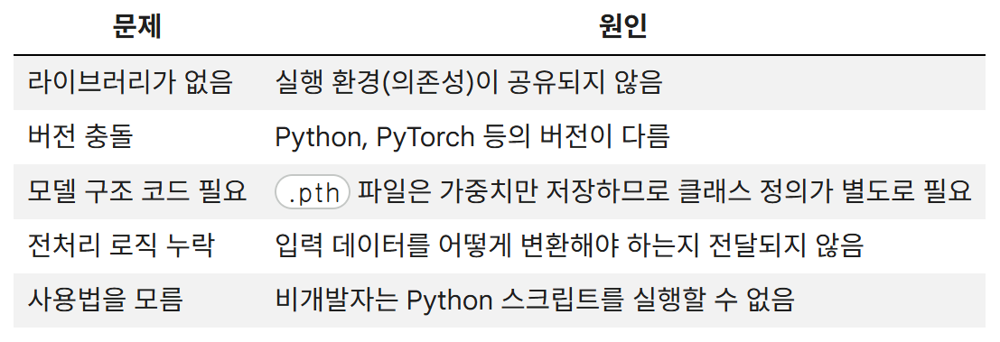

이 모든 문제의 공통점은 하나입니다:

> **모델이 특정 환경에 갇혀 있다.**

---

### 1.3 학습(Training)과 배포(Serving)는 다른 문제입니다



여러분이 지금까지 집중한 영역과 앞으로 배울 영역을 비교해 보겠습니다.


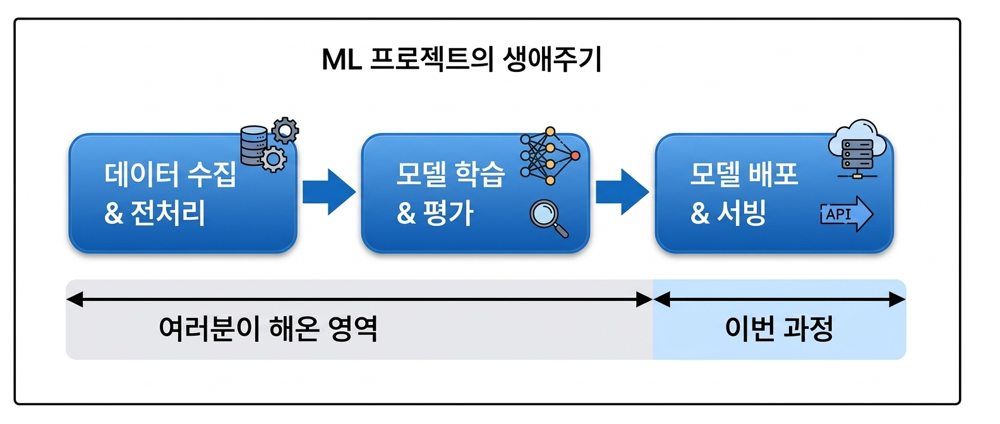

두 영역의 핵심 차이를 정리하면 다음과 같습니다:


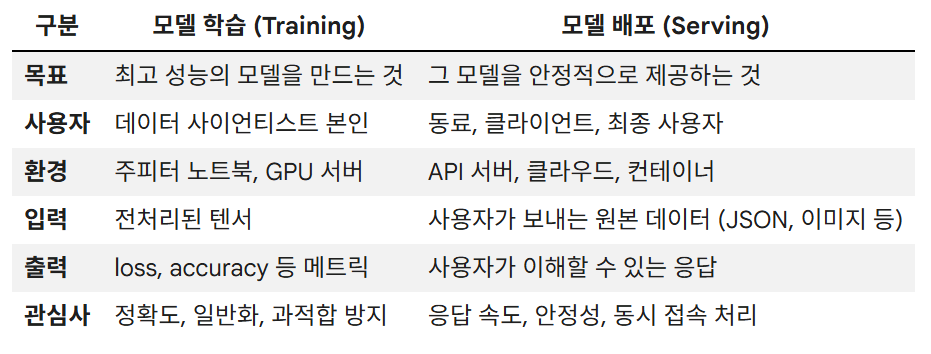


학습이 "좋은 모델을 만드는 것"이라면, 배포는 **"그 모델을 세상에 꺼내놓는 것"** 입니다.



---

### 1.4 배포란 결국 무엇입니까?

가장 단순하게 표현하면, 모델 배포는 이런 구조를 만드는 것입니다:

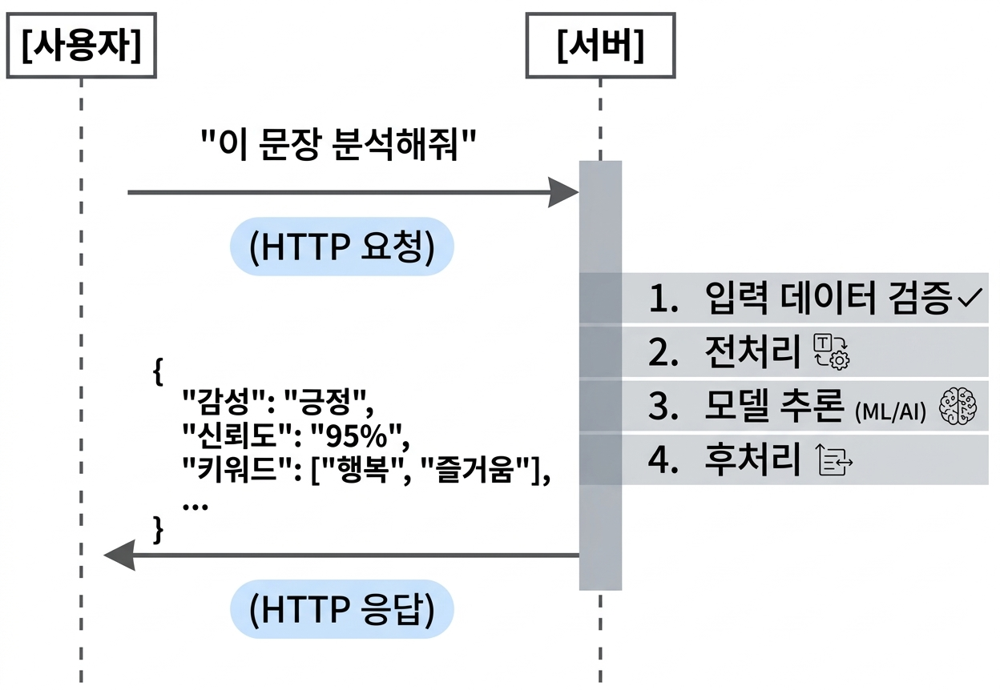


핵심을 요약하면:

- **사용자** 는 Python을 몰라도 됩니다.
- **서버** 가 모델, 전처리, 후처리를 모두 품고 있습니다.
- 소통 방식은 **HTTP(API)** 입니다.



### 1.5 진행하기 전에

이 과정에서 가장 중요한 원칙 하나를 말씀드리겠습니다.

> **"완벽한 모델보다, 동작하는 서비스가 먼저입니다."**

학습 단계에서는 accuracy를 0.1%라도 올리는 것이 중요했습니다.
하지만 배포 단계에서는 **일단 돌아가는 것**이 첫 번째 목표입니다.

이 과정에서 모델의 성능을 개선하는 내용은 다루지 않습니다.
대신, 여러분이 이미 만든 좋은 모델을 **세상 밖으로 꺼내는 방법**에 집중합니다.


### ✅ 체크포인트

다음 질문에 답할 수 있다면, 이 섹션의 학습 목표를 달성한 것입니다:

1. `.pth` 파일만 전달했을 때, 상대방이 모델을 바로 사용할 수 없는 이유는 무엇입니까?
2. 모델 학습(Training)과 모델 배포(Serving)의 핵심 차이를 한 문장으로 설명할 수 있습니까?
3. 모델 배포에서 사용자와 서버가 소통하는 방식은 무엇입니까?

---

> **다음 섹션에서는** 이 문제를 해결하기 위한 첫 번째 단계로,
> `venv`와 `requirements.txt`를 사용하여 실행 환경을 통제하는 방법을 학습합니다.

## 2. 환경 세팅: venv와 requirements.txt로 시작하기


> **학습 목표**
> - 가상환경이 왜 필요한지, 없으면 어떤 문제가 발생하는지 설명할 수 있습니다.
> - `venv`로 가상환경을 생성·활성화·비활성화할 수 있습니다.
> - `requirements.txt`를 작성하고, 이를 통해 동일한 환경을 재현할 수 있습니다.
> - 이 과정 전체에서 사용할 프로젝트 폴더 구조를 세팅합니다.

### 2.1 왜 가상환경이 필요합니까?

앞서 "내 컴퓨터에서는 되는데" 문제를 살펴보았습니다.  
그 문제의 첫 번째 원인은 **실행 환경이 공유되지 않는 것** 이었습니다.

구체적인 상황을 하나 보겠습니다.

```
[상황]

- 여러분의 컴퓨터: torch==2.1.0, transformers==4.35.0
- 동료의 컴퓨터: torch==2.3.0, transformers==4.41.0

- 여러분의 모델은 torch 2.1.0에서 저장되었습니다.
- 동료가 torch 2.3.0에서 불러오면?

  → 대부분은 동작합니다.  
  → 그러나 간혹 직렬화 포맷 변경, 내부 API 변경 등으로 에러가 발생합니다.  
  → 이 에러는 "가끔" 발생하기 때문에 더 위험합니다.  
```

이 문제를 해결하는 가장 기본적인 방법이 **가상환경(Virtual Environment)** 입니다.

가상환경의 핵심 아이디어는 단순합니다:

```
시스템 Python (전역)
├── numpy 1.24
├── torch 2.3.0          ← 다른 프로젝트가 설치한 버전
├── pandas 2.0
└── ...수십 개의 패키지

프로젝트 A의 가상환경 (격리됨)
├── torch 2.1.0          ← 이 프로젝트에 맞는 버전
├── transformers 4.35.0
└── fastapi 0.104.0

프로젝트 B의 가상환경 (격리됨)
├── torch 2.3.0          ← 다른 프로젝트는 다른 버전 사용 가능
├── langchain 0.1.0
└── ...
```


> **프로젝트마다 독립된 패키지 공간을 만들어서, 서로 간섭하지 않도록 격리하는 것.**
>
> 이것이 가상환경의 전부입니다.

### 2.2 venv로 가상환경 만들기

Python 3.3 이상에는 `venv` 모듈이 내장되어 있습니다.
별도 설치 없이 바로 사용할 수 있습니다.

> ⚠️ **참고**: Anaconda 환경에 익숙하신 분들도 계실 것입니다.  
> `conda`도 훌륭한 도구이지만, 이 과정에서는 `venv`를 사용합니다.  
> 이유는 이후 활용할 Docker와의 호환성, 그리고 실무 배포 환경에서의 경량성 때문입니다.  
> `venv`가 표준 라이브러리에 포함되어 있어 어떤 환경에서든 동일하게 동작한다는 장점도 있습니다.  

### 가상환경 생성

터미널(또는 주피터 노트북의 셀)에서 다음 명령어를 실행합니다.

```bash
# 프로젝트 폴더 생성 및 이동
mkdir model-serving-course
cd model-serving-course

# 가상환경 생성
관례적으로 .venv (숨김폴더) 또는 venv라는 이름을 사용합니다만,
여러분들의 고유한 가상환경 이름으로 만들어주세요!

python -m venv .venv_여러분의고유한이름

```

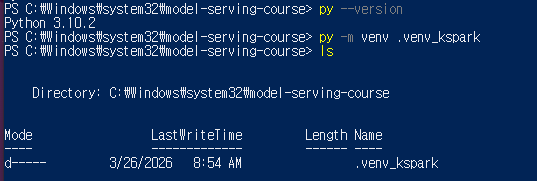

실행 후 폴더 구조를 확인해 보겠습니다.

```bash
model-serving-course/
└── .venv/
    ├── bin/          # (Windows: Scripts/) 활성화 스크립트, python 실행 파일
    ├── include/      # C 확장 헤더 파일
    ├── lib/          # 설치된 패키지들이 여기에 저장됩니다
    └── pyvenv.cfg    # 가상환경 설정 파일
```

`.venv` 폴더 안에 격리된 Python 환경이 만들어진 것입니다.

### 가상환경 활성화

```bash
# macOS / Linux
source .venv/bin/activate

# Windows (Command Prompt)
.venv\Scripts\activate

# Windows (PowerShell)
.venv\Scripts\Activate.ps1
```

활성화가 되면 터미널 프롬프트 앞에 `(.venv)`가 표시됩니다.

```bash
(.venv) $ python --version
Python 3.11.5

(.venv) $ which python          # macOS/Linux
/Users/yourname/model-serving-course/.venv/bin/python

(.venv) $ where python           # Windows
C:\Users\yourname\model-serving-course\.venv\Scripts\python.exe

```

이제 이 터미널에서 `pip install`을 하면, 전역이 아니라 `.venv` 안에만 패키지가 설치됩니다.

윈도우 파워쉘에는 스크립트 실행 방지 정책이 존재합니다. 에러를 겪으신다면 아래 명령어를 입력하세요  
```bash
Set-ExecutionPolicy -ExecutionPolicy RemoteSigned -Scope CurrentUser
```

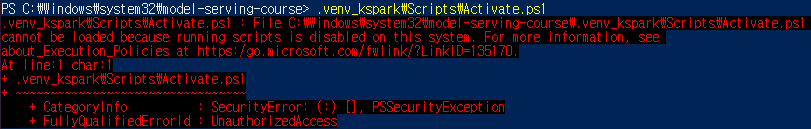

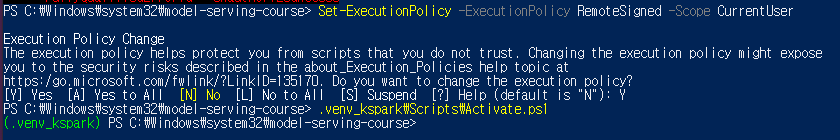

### 가상환경 비활성화

```bash
(.venv) $ deactivate
$                                # (.venv) 표시가 사라집니다
```

### 2.3 실습: 가상환경을 직접 만들어 봅시다


> 📌 **주피터 노트북에서의 실행**
>
> 주피터 노트북 셀에서 터미널 명령어를 실행하려면 앞에 `!`를 붙입니다.  
> 다만 가상환경 **활성화**는 `!source`로는 동작하지 않습니다 (서브셸에서 실행되기 때문).  
> 주피터에서는 가상환경을 커널로 등록하는 방식을 사용합니다.  
> 아래에서 함께 진행하겠습니다.  

**Step 1**: 프로젝트 폴더와 가상환경 생성

⚠️ 주의: 클라우드 환경(Colab) 사용자  
만약 구글 코랩이나 Kaggle Kernel을 사용 중이라면 venv를 만들지 마세요.  
이미 클라우드에서 제공하는 격리된 환경을 사용 중이므로, 바로 !pip install을 통해 필요한 라이브러리를 설치하면 됩니다.  

In [4]:
#python
import os

# 작업 디렉토리 확인
print(f"현재 위치: {os.getcwd()}")

현재 위치: /Users/choiseunghyeon/AIFFEL_Quest_ENG/06_Deployment/DP01


In [5]:
#bash
# 셀에서 실행
!python -m venv .venv
# 코랩에서 진행할 경우, 에러가 발생합니다

zsh:1: command not found: python


In [6]:
# python
# 가상환경이 생성되었는지 확인
import os
print(os.path.exists(".venv"))       # True가 출력되어야 합니다
print(os.listdir(".venv"))           # ['bin', 'include', 'lib', 'pyvenv.cfg'] 등

True
['bin', 'include', 'pyvenv.cfg', 'lib']


**Step 2**: 가상환경을 주피터 커널로 등록


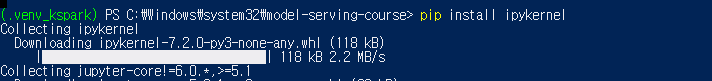

가상환경 내에서는 간단하게 pip install 로 설치할 수도 있습니다

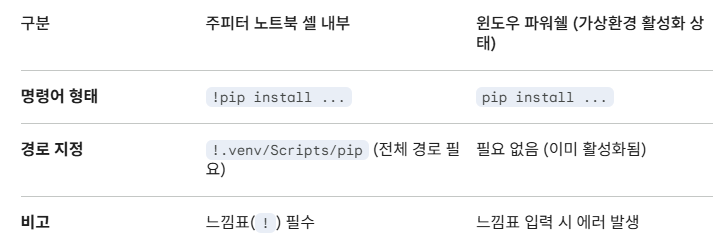

In [7]:
# bash
# 가상환경의 pip으로 ipykernel 설치
!.venv/bin/pip install ipykernel

  Using cached ipykernel-6.31.0-py3-none-any.whl (117 kB)
  Using cached pyzmq-27.1.0-cp39-cp39-macosx_10_15_universal2.whl (1.3 MB)
  Using cached jupyter_client-8.6.3-py3-none-any.whl (106 kB)
  Using cached comm-0.2.3-py3-none-any.whl (7.3 kB)
  Using cached tornado-6.5.8-cp39-abi3-macosx_10_9_universal2.whl (449 kB)
  Using cached packaging-26.3-py3-none-any.whl (129 kB)
  Using cached ipython-8.18.1-py3-none-any.whl (808 kB)
  Using cached traitlets-5.15.1-py3-none-any.whl (85 kB)
  Using cached jupyter_core-5.8.1-py3-none-any.whl (28 kB)
  Using cached matplotlib_inline-0.2.2-py3-none-any.whl (9.5 kB)
  Using cached psutil-7.2.2-cp36-abi3-macosx_11_0_arm64.whl (129 kB)
  Using cached appnope-0.1.4-py2.py3-none-any.whl (4.3 kB)
  Using cached debugpy-1.8.21-py2.py3-none-any.whl (5.4 MB)
  Using cached nest_asyncio-1.6.0-py3-none-any.whl (5.2 kB)
  Using cached prompt_toolkit-3.0.52-py3-none-any.whl (391 kB)
  Using cached jedi-0.19.2-py2.py3-none-any.whl (1.6 MB)
  Using cached pe

In [8]:
# bash
# 주피터 커널로 등록
!.venv/bin/python -m ipykernel install --user --name=model-serving --display-name="Model Serving"

Installed kernelspec model-serving in /Users/choiseunghyeon/Library/Jupyter/kernels/model-serving


In [9]:
# Windows의 경우:
# !.venv\Scripts\pip install ipykernel
# !.venv\Scripts\python -m ipykernel install --user --name=model-serving --display-name="Model Serving"

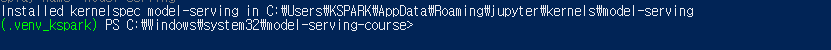

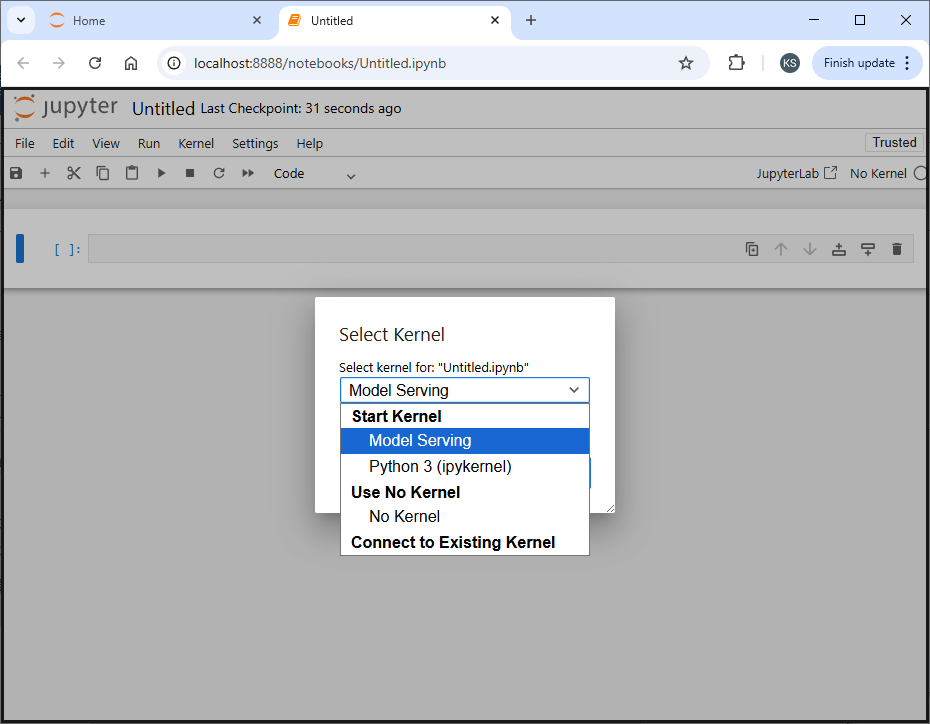


> 등록이 완료되면, 주피터 노트북 상단 메뉴에서
> **Kernel → Change Kernel → "Model Serving"** 을 선택하여 전환합니다.
>
> 이후 모든 셀은 가상환경 내의 Python으로 실행됩니다.

**Step 3**: 커널 전환 후 확인

In [10]:
#python
# 커널을 "Model Serving"으로 전환한 뒤 실행합니다
import sys
print(f"Python 경로: {sys.executable}")
# 출력에 .venv가 포함되어 있으면 성공입니다
# 예: /Users/yourname/model-serving-course/.venv/bin/python

Python 경로: /Library/Developer/CommandLineTools/usr/bin/python3


### 2.4 requirements.txt — 환경을 기록하는 방법


가상환경을 만들었지만, 이것만으로는 부족합니다.  
동료에게 `.venv` 폴더를 통째로 보낼 수는 없기 때문입니다. (용량도 크고, OS에 종속적입니다.)  

대신, **어떤 패키지가 어떤 버전으로 필요한지 목록**을 공유합니다.  
그것이 `requirements.txt`입니다.  

### 직접 작성하기

이 과정에서 사용할 핵심 패키지를 미리 정의하겠습니다.

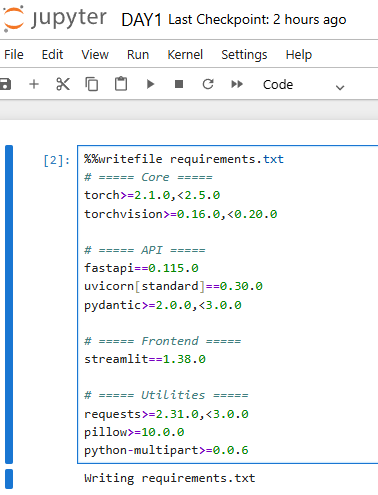

In [11]:
# requirements.txt 생성 (%%writefile 은 셀 첫 줄이어야 해서 Path.write_text 사용)
from pathlib import Path

Path("requirements.txt").write_text(
    """# ===== Core =====
torch>=2.1.0,<2.5.0
torchvision>=0.16.0,<0.20.0

# ===== API =====
fastapi==0.115.0
uvicorn[standard]==0.30.0
pydantic>=2.0.0,<3.0.0

# ===== Frontend =====
streamlit==1.38.0

# ===== Utilities =====
requests>=2.31.0,<3.0.0
pillow>=10.0.0
python-multipart>=0.0.6
""",
    encoding="utf-8",
)
print("wrote", Path("requirements.txt").resolve())
print(Path("requirements.txt").read_text(encoding="utf-8"))


wrote /Users/choiseunghyeon/AIFFEL_Quest_ENG/06_Deployment/DP01/requirements.txt
# ===== Core =====
torch>=2.1.0,<2.5.0
torchvision>=0.16.0,<0.20.0

# ===== API =====
fastapi==0.115.0
uvicorn[standard]==0.30.0
pydantic>=2.0.0,<3.0.0

# ===== Frontend =====
streamlit==1.38.0

# ===== Utilities =====
requests>=2.31.0,<3.0.0
pillow>=10.0.0
python-multipart>=0.0.6



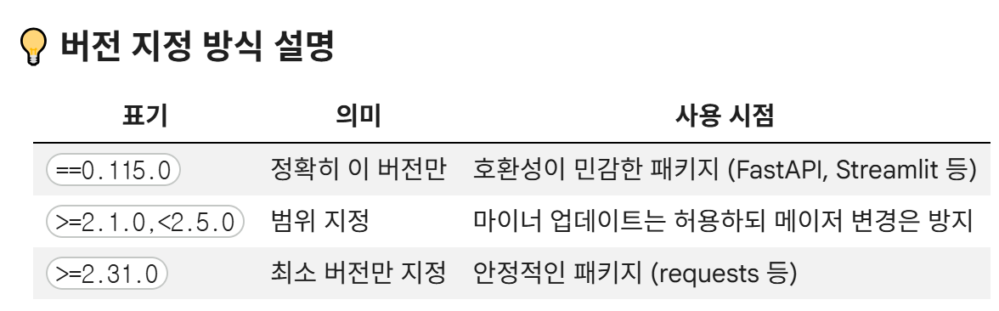

> 실무에서는 `==`로 고정하는 것이 가장 안전합니다.  
> 이 과정에서는 학습 편의를 위해 일부 범위 지정을 사용합니다.

### requirements.txt로 패키지 설치하기

```bash
# 가상환경이 활성화된 상태에서 (또는 주피터에서 커널 전환 후)
!pip install -r requirements.txt
```

필자는 주피터 랩을 열어 터미널에서 작업을 수행했습니다.

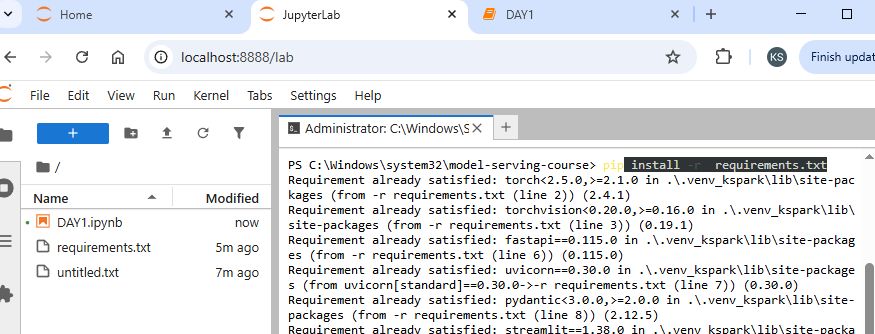



```python
# 설치 확인
import torch
import fastapi
import streamlit

print(f"PyTorch:   {torch.__version__}")
print(f"FastAPI:   {fastapi.__version__}")
print(f"Streamlit: {streamlit.__version__}")
```

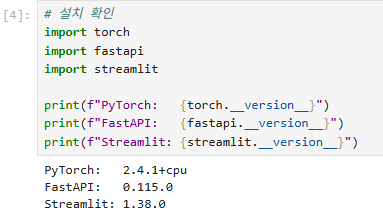

설치가 잘 되었습니다!  

### 현재 환경을 requirements.txt로 내보내기

이미 패키지가 설치된 환경에서 목록을 추출할 수도 있습니다.




```bash
!pip freeze > requirements_freeze.txt
!cat requirements_freeze.txt #터미널에서 출력
```


```
# 출력 예시 (pip freeze는 모든 의존성을 포함하여 정확한 버전을 기록합니다)
certifi==2024.2.2
charset-normalizer==3.3.2
fastapi==0.115.0
...
torch==2.1.0
...
uvicorn==0.30.0
```

> ⚠️ **pip freeze vs 직접 작성**
>
> `pip freeze`는 하위 의존성까지 모두 포함하므로 정밀한 재현에 유리합니다.
> 하지만 목록이 길어져서 가독성이 떨어집니다.
>
> 실무에서는 두 가지를 병행하는 경우가 많습니다:
> - `requirements.txt` — 사람이 직접 관리하는 핵심 패키지 목록
> - `requirements_freeze.txt` — `pip freeze`로 생성한 전체 목록 (정밀 재현용)

### 2.5 프로젝트 폴더 구조 세팅

앞으로 사용할 프로젝트의 기본 구조를 미리 만들어 두겠습니다.

In [12]:

import os

# 폴더 구조 생성
folders = [
    "models",          # 저장된 모델 파일 (.pth, .onnx 등)
    "app",             # FastAPI 애플리케이션 코드
    "frontend",        # Streamlit 프론트엔드 코드
    "notebooks",       # 주피터 노트북 (지금 이 파일)
    "data",            # 샘플 데이터
    "tests",           # 테스트 코드
]

for folder in folders:
    os.makedirs(folder, exist_ok=True)
    print(f"✅ {folder}/ 생성 완료")

✅ models/ 생성 완료
✅ app/ 생성 완료
✅ frontend/ 생성 완료
✅ notebooks/ 생성 완료
✅ data/ 생성 완료
✅ tests/ 생성 완료


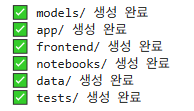

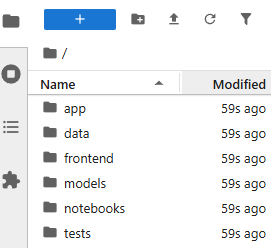

```
# 최종 프로젝트 구조
model-serving-course/
├── .venv/                  # 가상환경 (Git에 포함하지 않음)
├── models/                 # 직렬화된 모델 파일
├── app/                    # FastAPI 백엔드
├── frontend/               # Streamlit 프론트엔드
├── notebooks/              # 학습용 노트북
├── data/                   # 샘플 데이터
├── tests/                  # 테스트
├── requirements.txt        # 의존성 목록
└── .gitignore              # Git 제외 설정
```

### .gitignore 작성

`.venv`와 모델 파일 등 Git에 올리면 안 되는 항목을 정리합니다.




```python
%%writefile .gitignore
# 가상환경
.venv/

# Python 캐시
__pycache__/
*.pyc
*.pyo

# 모델 파일 (용량이 크므로 Git에 포함하지 않음)
models/*.pth
models/*.onnx
models/*.pt

# 주피터 체크포인트
.ipynb_checkpoints/

# OS 파일
.DS_Store
Thumbs.db
```

```python
# 생성 확인
!cat .gitignore
```

### 2.6 환경 재현 테스트

가상환경과 requirements.txt가 제대로 작동하는지 시뮬레이션해 봅니다.

> 이 실습은 "동료에게 프로젝트를 전달하는 상황"을 재현하는 것입니다.

```bash
# 1. 새로운 가상환경을 하나 더 만듭니다 (동료의 컴퓨터를 시뮬레이션)
!python -m venv .venv_test

# 2. 그 환경에 requirements.txt로 설치합니다
!.venv_test/bin/pip install -r requirements.txt -q

# 3. 핵심 패키지가 동일하게 설치되었는지 확인합니다
!.venv_test/bin/python -c "import torch; import fastapi; print(f'torch={torch.__version__}, fastapi={fastapi.__version__}')"
```

```python
# 4. 테스트가 끝났으면 정리합니다
import shutil
shutil.rmtree(".venv_test", ignore_errors=True)
print("✅ 테스트 환경 삭제 완료")
```

만약 Step 3에서 원본 환경과 동일한 버전이 출력된다면,
**환경 재현에 성공** 한 것입니다.

이것이 `requirements.txt`의 힘입니다.
"내 컴퓨터에서는 되는데" 문제의 절반은 이것만으로 해결됩니다.

> 나머지 절반은? 이후 학습할 **Docker** 가 해결합니다.

### ✅ 체크포인트

다음 질문에 답할 수 있다면, 이 섹션의 학습 목표를 달성한 것입니다:

1. 가상환경 없이 `pip install`을 하면 패키지가 어디에 설치됩니까?
   그것이 왜 문제가 될 수 있습니까?
2. `pip freeze`로 생성한 파일과 직접 작성한 `requirements.txt`의 차이는 무엇입니까?
3. 동료에게 프로젝트를 전달할 때, `.venv` 폴더 대신 무엇을 공유해야 합니까?


## 3. RESTful API의 이해: HTTP 메서드, 상태코드, JSON


> **학습 목표**
> - API가 무엇인지, 왜 모델 배포에서 핵심인지 설명할 수 있습니다.
> - HTTP 메서드(GET, POST)의 차이를 이해하고, 모델 추론에 어떤 메서드를 사용하는지 알 수 있습니다.
> - HTTP 상태 코드의 의미를 알고, 에러 상황을 구분할 수 있습니다.
> - JSON 포맷으로 데이터를 주고받는 구조를 이해합니다.
> - Python으로 실제 API를 호출해 봅니다.

### 3.1 API란 무엇입니까?


API는 **Application Programming Interface**의 약자입니다.
한국어로 직역하면 "응용 프로그램 간의 소통 규약"인데, 이것만으로는 와닿지 않습니다.

익숙한 비유로 설명하겠습니다.

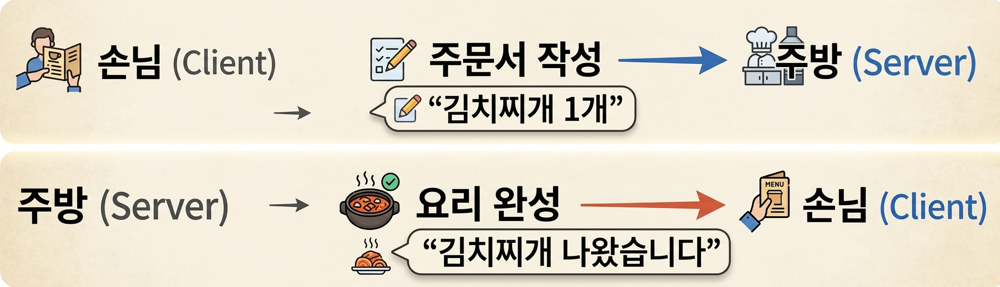

- 손님은 주방에 직접 들어가지 않습니다.
- 주문서(API 규약)에 맞춰 요청하면, 주방이 결과를 내놓습니다.
- 주방 내부에서 어떤 재료를, 어떤 순서로 조리하는지 손님은 알 필요가 없습니다.

모델 배포에서도 동일합니다.

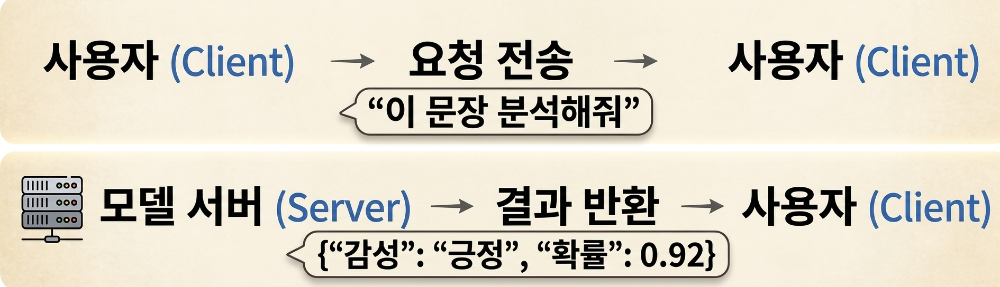

- 사용자는 PyTorch가 설치되어 있지 않아도 됩니다.
- 요청 형식(API 규약)에 맞춰 데이터를 보내면, 서버가 추론 결과를 돌려줍니다.
- 모델이 어떤 구조인지, 전처리를 어떻게 하는지 사용자는 알 필요가 없습니다.

> **API = 약속된 형식으로 요청하면, 약속된 형식으로 응답을 받는 소통 규약**


### 3.2 REST란 무엇입니까?



API를 설계하는 방식은 여러 가지가 있습니다.  
그 중 가장 널리 쓰이는 방식이 **REST (Representational State Transfer)** 입니다.  

REST의 핵심 원칙은 간단합니다:

```
1. URL로 "무엇을" 지정한다       → https://api.example.com/predictions
2. HTTP 메서드로 "어떻게" 지정한다 → POST (새로운 예측을 요청)
3. 데이터는 JSON으로 주고받는다    → {"text": "이 영화 재밌다"}
```

REST 방식을 따르는 API를 **RESTful API**라 고 부릅니다.  
다음 실습에서 진행할 FastAPI 서버가 바로 이 RESTful API입니다.


#### 원칙 1: 리소스(Resource)와 URL

REST에서는 모든 것을 **리소스**로 바라봅니다.
리소스란 API가 다루는 대상을 의미하며, 각 리소스는 고유한 URL을 가집니다.

```
리소스                    URL (엔드포인트)
───────────────────────────────────────────────
모델 목록                 /models
특정 모델 정보             /models/sentiment-v1
예측 요청                 /predictions
특정 예측 결과             /predictions/42
모델 상태 확인             /health
```

```
좋은 예:
  GET  /models                    → 모델 목록 조회
  GET  /models/sentiment-v1       → 특정 모델 조회
  POST /models/sentiment-v1/predict  → 해당 모델로 예측 요청

나쁜 예:
  GET  /getModels                 → 동사를 URL에 넣지 않습니다
  POST /doPredict                 → 동작은 HTTP 메서드가 표현합니다
  GET  /model_list_all            → 일관성 없는 네이밍
```

> **핵심 규칙**: URL은 **명사(무엇을)** 를 나타내고, HTTP 메서드가 **동사(어떻게)** 를 나타냅니다.


#### 원칙 2: HTTP 메서드로 행동을 표현

같은 URL이라도 HTTP 메서드에 따라 다른 동작을 수행합니다.

```
URL: /models/sentiment-v1

GET    /models/sentiment-v1         → 이 모델의 정보를 조회합니다
PUT    /models/sentiment-v1         → 이 모델의 설정을 수정합니다
DELETE /models/sentiment-v1         → 이 모델을 삭제합니다
POST   /models/sentiment-v1/predict → 이 모델에 예측을 요청합니
다
```

URL과 메서드를 분리함으로써, API의 구조가 직관적이고 예측 가능해집니다.

#### 원칙 3: 무상태(Stateless)

REST에서 서버는 **클라이언트의 상태를 기억하지 않습니다**.  
매 요청은 독립적이며, 요청에 필요한 모든 정보를 스스로 포함해야 합니다.

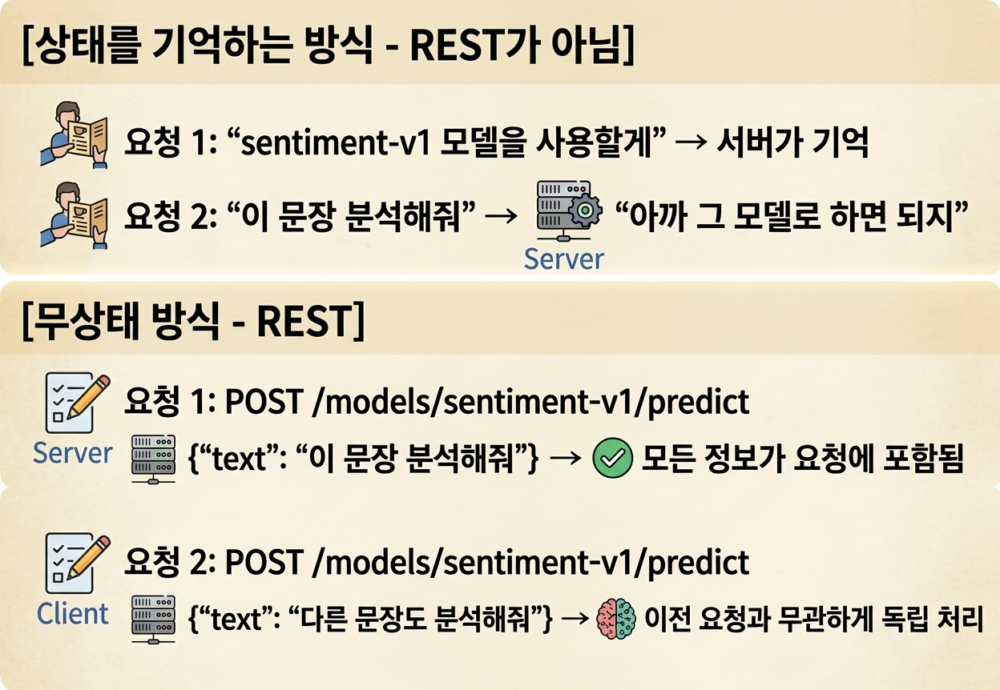

왜 무상태여야 할까요?



```
- 서버가 상태를 기억하면, 서버가 여러 대일 때 문제가 됩니다.
  (요청 1은 서버 A가 받고, 요청 2는 서버 B가 받으면?)
- 무상태이면 어떤 서버가 받아도 동일하게 처리할 수 있습니다.
- 서버 확장(Scale-out)이 쉬워집니다.
```

> 모델 추론 API는 본질적으로 무상태에 적합합니다.  
> 입력이 들어오면 예측하고, 결과를 반환하고, 끝입니다.  
> 이전에 어떤 요청이 있었는지 기억할 필요가 없습니다.  


#### 원칙 4: 표현(Representation)을 통한 데이터 전송

REST에서 클라이언트와 서버는 리소스 자체를 주고받는 것이 아니라,  
리소스의 **표현(Representation)** 을 주고받습니다.

가장 널리 쓰이는 표현 형식이 **JSON**입니다.


```
[서버 내부의 리소스]
  PyTorch 모델 객체, GPU 메모리 위의 텐서, 복잡한 Python 객체 ...

[클라이언트에게 전달되는 표현]
  {
      "model_name": "sentiment-v1",
      "version": "1.0.0",
      "status": "running"
  }

→ 클라이언트는 서버 내부 구조를 알 필요 없이,
  JSON이라는 표준 형식으로 정보를 주고받습니다.
```

이 원칙 덕분에, 클라이언트는 Python이 아닌 JavaScript, Java, Go 등
어떤 언어로든 API를 호출할 수 있습니다.


#### 원칙 5: 클라이언트-서버 분리

클라이언트(UI, 프론트엔드)와 서버(모델, 백엔드)는 독립적으로 개발·배포됩니다.

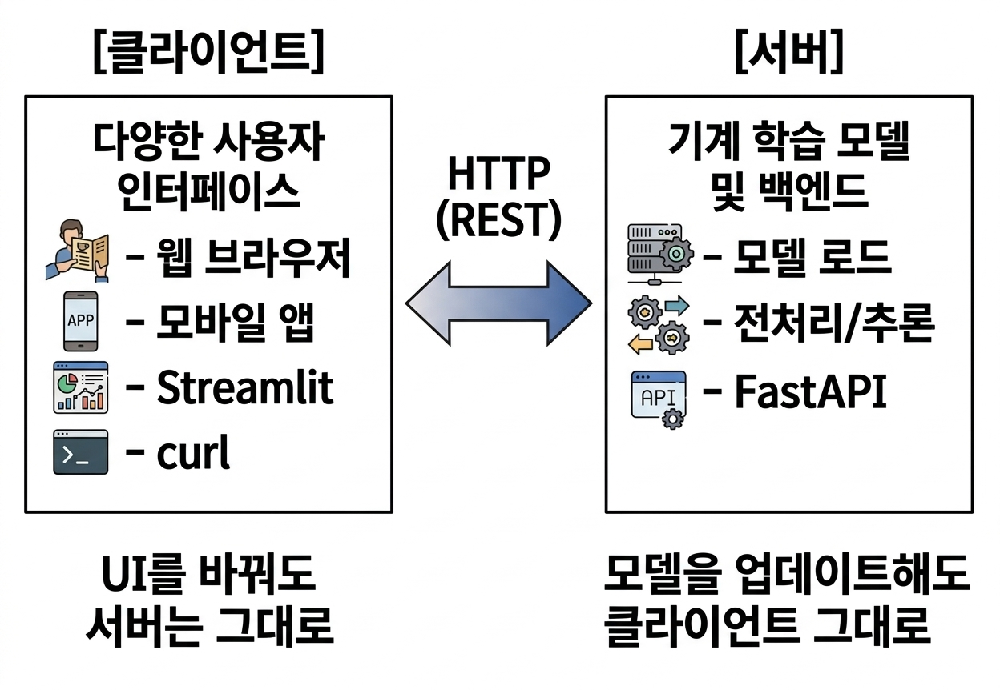

FastAPI(서버)와 Streamlit(클라이언트)을 독립적으로 개발하고 연결하는 과정에서,
이 원칙의 실용적 가치를 느끼실 것입니다.

#### 정리: REST의 핵심 원칙 요약

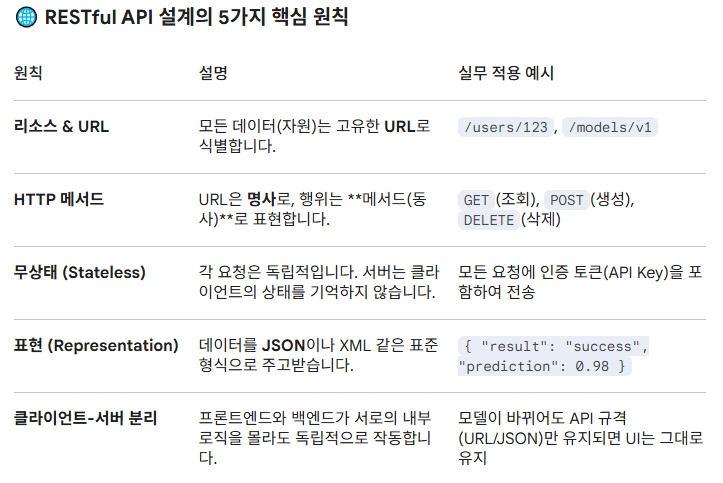

> REST 방식을 따르는 API를 **RESTful API**라고 부릅니다.


### 3.3 HTTP 메서드 — "어떻게" 하고 싶은지 표현하기

HTTP 메서드는 서버에 **어떤 동작을 요청하는지** 나타냅니다.  
전체 메서드는 여러 가지가 있지만, 모델 배포에서 주로 사용하는 것은 두 가지입니다.

#### GET — "데이터를 조회하고 싶습니다"

```
GET /models/sentiment-v1/info

→ 서버 응답:
{
    "model_name": "sentiment-v1",
    "version": "1.0.0",
    "status": "running",
    "accuracy": 0.94
}
```

- 서버로부터 정보를 **읽어올 때** 사용합니다.
- 요청에 본문(body)이 없습니다. 필요한 정보는 URL에 포함합니다.
- 같은 요청을 여러 번 보내도 결과가 동일합니다 (멱등성).

#### POST — "데이터를 보내고, 처리 결과를 받고 싶습니다"

```
POST /predictions

요청 본문:
{
    "text": "이 영화 정말 재밌다"
}

→ 서버 응답:
{
    "label": "긍정",
    "confidence": 0.92
}
```

- 서버에 데이터를 **보내서 처리를 요청할 때** 사용합니다.
- 요청 본문(body)에 데이터를 담아 보냅니다.
- **모델 추론 요청은 대부분 POST를 사용합니다.** 입력 데이터를 본문에 담아야 하기 때문입니다.

#### 그 외 메서드 (참고)

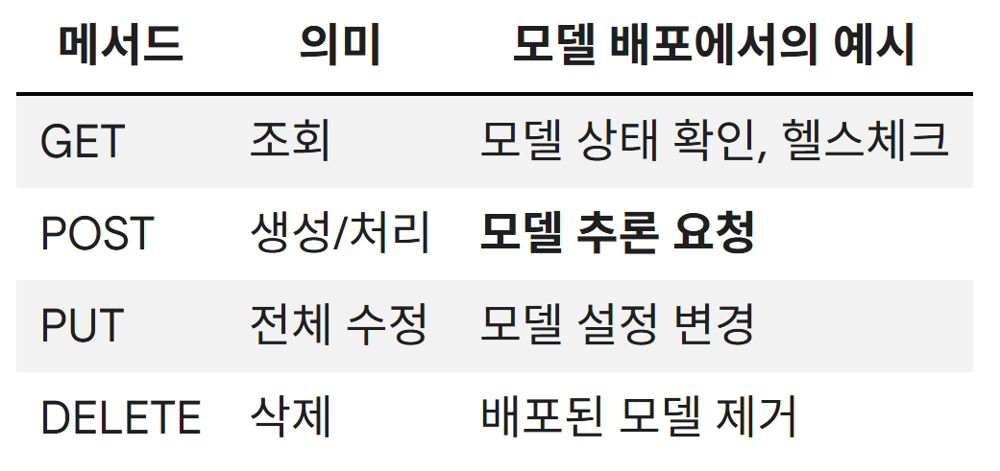

> 이 과정에서는 **GET**과 **POST**에 집중합니다.  
> 이 두 가지만 알아도 모델 추론 API를 만들고 사용할 수 있습니다.

### 3.4 HTTP 상태 코드 — 서버의 대답을 이해하기

서버는 응답할 때 항상 **상태 코드(Status Code)**를 함께 보냅니다.
세 자리 숫자로 되어 있으며, 첫 번째 숫자가 의미를 결정합니다.

```
2xx → 성공 (요청이 정상적으로 처리됨)
4xx → 클라이언트 잘못 (요청이 잘못됨)
5xx → 서버 잘못 (서버 내부에서 에러 발생)
```

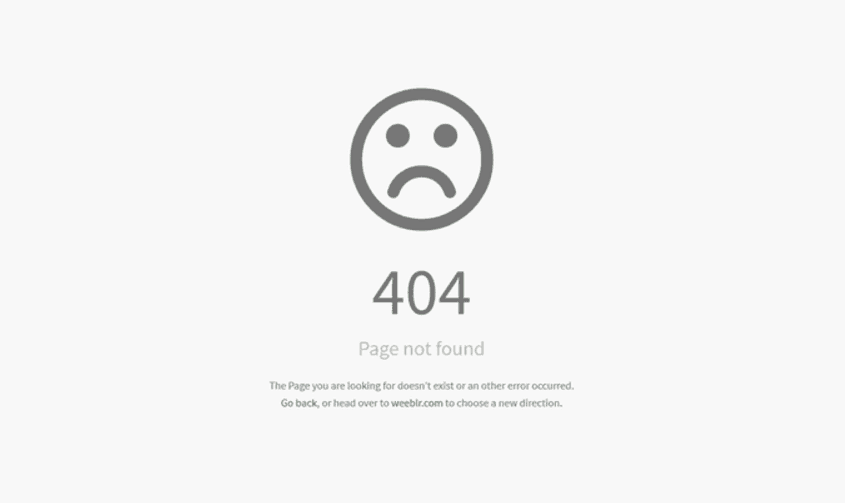

여러분들이 자주 보는 바로 그것입니다.

모델 배포에서 자주 만나게 될 상태 코드를 정리하겠습니다.


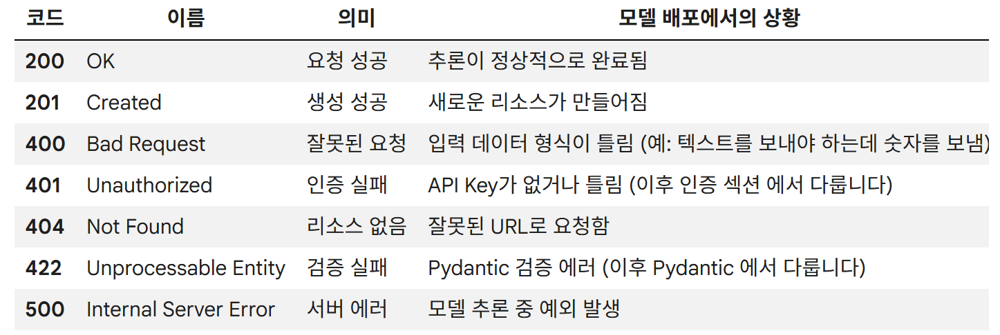


> 💡 **실무 팁**
>
> API를 개발할 때, 에러 상황에서 적절한 상태 코드를 반환하는 것이 매우 중요합니다.  
> 모든 에러를 500으로 처리하면, 클라이언트가 "내가 잘못한 건지, 서버가 고장난 건지" 구분할 수 없습니다.  
> 이 부분은 추후 에러 핸들링을 다룰 때 자세히 실습합니다.  

### 3.5 JSON — 데이터를 주고받는 형식



API에서 데이터를 주고받을 때 가장 널리 사용되는 형식이 **JSON (JavaScript Object Notation)** 입니다.

Python의 딕셔너리와 매우 유사하게 생겼습니다.

```json
{
    "model": "sentiment-v1",
    "input": {
        "text": "이 영화 정말 재밌다"
    },
    "options": {
        "return_probabilities": true,
        "language": "ko"
    }
}
```

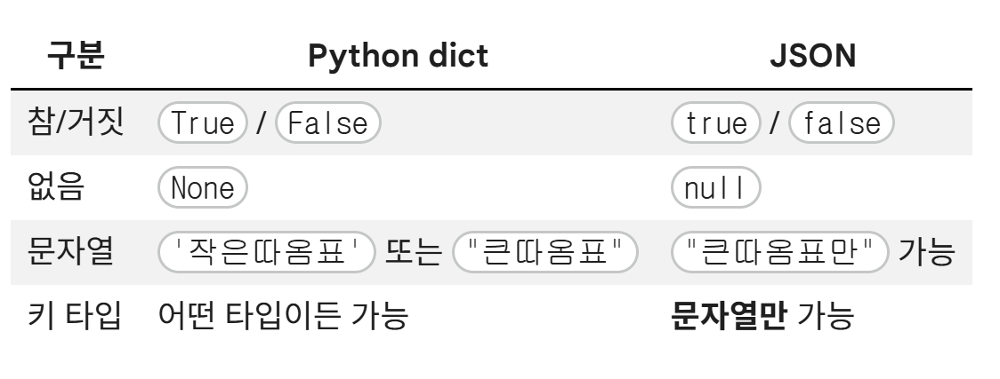

Python에서 JSON을 다루는 방법을 직접 실습해 보겠습니다.


In [13]:
import json

# Python dict → JSON 문자열 (직렬화)
data = {
    "text": "이 영화 정말 재밌다",
    "return_probabilities": True,
    "max_length": None
}

json_string = json.dumps(data, ensure_ascii=False, indent=2)
print("=== Python → JSON ===")
print(json_string)
print(f"타입: {type(json_string)}")  #

=== Python → JSON ===
{
  "text": "이 영화 정말 재밌다",
  "return_probabilities": true,
  "max_length": null
}
타입: <class 'str'>


```
=== Python → JSON ===
{
  "text": "이 영화 정말 재밌다",
  "return_probabilities": true,
  "max_length": null
}
타입: <class 'str'>
```

In [14]:

# JSON 문자열 → Python dict (역직렬화)
parsed = json.loads(json_string)
print("\n=== JSON → Python ===")
print(parsed)
print(f"타입: {type(parsed)}")       #
print(f"텍스트: {parsed['text']}")   # 이 영화 정말 재밌다


=== JSON → Python ===
{'text': '이 영화 정말 재밌다', 'return_probabilities': True, 'max_length': None}
타입: <class 'dict'>
텍스트: 이 영화 정말 재밌다


> 💡 **ensure_ascii=False**
>
> `json.dumps()`에서 이 옵션을 빼면 한글이 `\uC774 \uC601\uD654...`처럼 유니코드 이스케이프로 변환됩니다.  
한글 데이터를 다룰 때는 반드시 `ensure_ascii=False`를 사용합니다.


### 3.6 실습: 실제 API를 호출해 봅시다

개념만으로는 감이 오지 않을 수 있습니다.  
실제 동작하는 공개 API를 Python으로 호출해 보겠습니다.

In [15]:

import requests

# JSONPlaceholder: 테스트용 공개 REST API
response = requests.get("https://jsonplaceholder.typicode.com/posts/1")

print(f"상태 코드: {response.status_code}")   # 200
print(f"응답 타입: {type(response.json())}")   #
print(f"응답 내용:")
print(json.dumps(response.json(), indent=2))


/Users/choiseunghyeon/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


상태 코드: 200
응답 타입: <class 'dict'>
응답 내용:
{
  "userId": 1,
  "id": 1,
  "title": "sunt aut facere repellat provident occaecati excepturi optio reprehenderit",
  "body": "quia et suscipit\nsuscipit recusandae consequuntur expedita et cum\nreprehenderit molestiae ut ut quas totam\nnostrum rerum est autem sunt rem eveniet architecto"
}



#### POST 요청 — 데이터 전송


In [16]:

# POST 요청: 새로운 데이터를 전송합니다
response = requests.post(
    "https://jsonplaceholder.typicode.com/posts",
    json={                                # json= 을 사용하면 자동으로 JSON 변환 + 헤더 설정
        "title": "모델 배포 테스트",
        "body": "FastAPI로 모델을 서빙합니다",
        "userId": 1
    }
)

print(f"상태 코드: {response.status_code}")   # 201 (Created)
print(f"응답 내용:")
print(json.dumps(response.json(), ensure_ascii=False, indent=2))

상태 코드: 201
응답 내용:
{
  "title": "모델 배포 테스트",
  "body": "FastAPI로 모델을 서빙합니다",
  "userId": 1,
  "id": 101
}


#### 에러 상황 체험


In [17]:

# 존재하지 않는 리소스에 GET 요청
response = requests.get("https://jsonplaceholder.typicode.com/posts/99999")
print(f"상태 코드: {response.status_code}")   # 404 (Not Found)
print(f"응답 내용: {response.json()}")         # {}

상태 코드: 404
응답 내용: {}


In [18]:
# 잘못된 URL로 요청
try:
    response = requests.get("https://jsonplaceholder.typicode.com/없는경로")
    print(f"상태 코드: {response.status_code}")   # 404
except requests.exceptions.RequestException as e:
    print(f"요청 실패: {e}")

상태 코드: 404



### 3.7 모델 추론 API의 구조 미리보기

지금까지 배운 내용을 종합하면, 앞으로 만들어나갈 모델 추론 API의 구조가 보입니다.

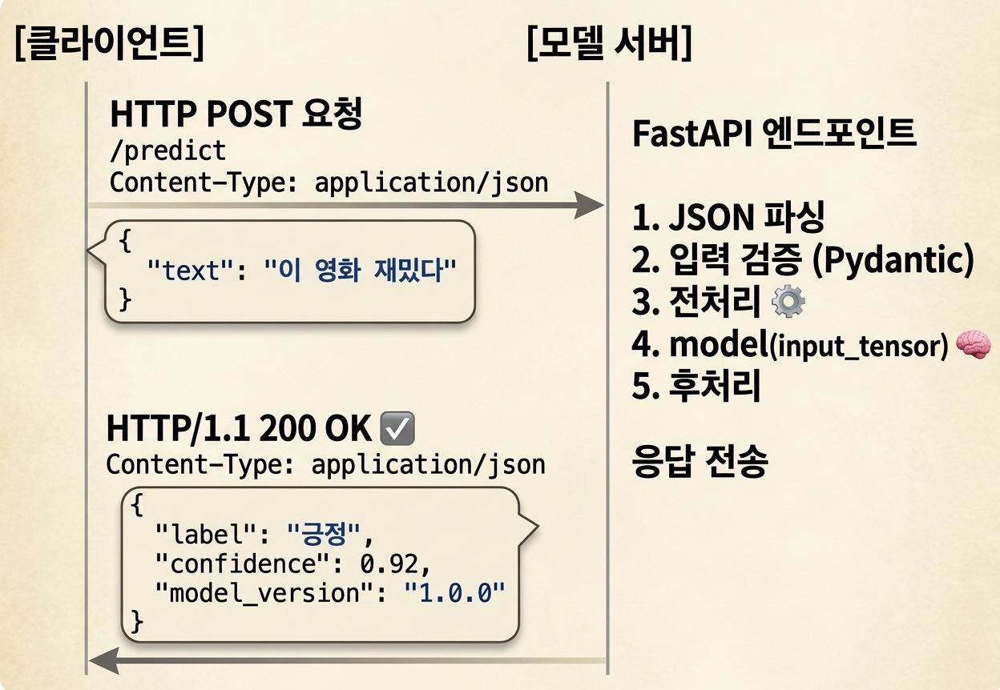

이 구조에서 오늘 배운 개념이 어디에 해당하는지 확인해 보겠습니다:

- **HTTP 메서드**: POST (입력 데이터를 본문에 담아 보내야 하므로)
- **JSON**: 요청과 응답 모두 JSON 형식
- **상태 코드**: 성공 시 200, 입력 오류 시 422, 서버 에러 시 500
- **URL 설계**: `/predict` — 무엇을 하는 API인지 직관적으로 알 수 있는 경로

코드로 핵심 구조를 보자면 다음의 형태가 됩니다  


```python

# 미리보기: 추후 만들게 될 코드의 핵심 구조  
# (지금은 실행하지 않아도 됩니다 — 구조만 눈에 익혀 두세요)  

from fastapi import FastAPI
from pydantic import BaseModel

app = FastAPI()

class PredictRequest(BaseModel):
    text: str

class PredictResponse(BaseModel):
    label: str
    confidence: float

@app.post("/predict", response_model=PredictResponse)
def predict(request: PredictRequest):
    # 1. 전처리
    # 2. 모델 추론
    # 3. 후처리
    return PredictResponse(label="긍정", confidence=0.92)

```


### ✅ 체크포인트

다음 질문에 답할 수 있다면, 이 섹션의 학습 목표를 달성한 것입니다:

1. 모델 추론 요청에 GET이 아닌 POST를 사용하는 이유는 무엇입니까?
2. 상태 코드 `422`는 어떤 상황에서 발생합니까?
3. `requests.post(url, json=data)`에서 `json=` 파라미터는 내부적으로 어떤 일을 합니까?
4. Python의 `True`는 JSON에서 어떻게 표현됩니까?

## 4. 모델 직렬화(Serialization): Pickle, ONNX, TorchScript


> **학습 목표**
> - 직렬화(Serialization)가 무엇이고, 왜 모델 배포에 필수적인지 설명할 수 있습니다.
> - PyTorch 모델을 저장하는 세 가지 방법(state_dict, TorchScript, ONNX)의 차이를 구분할 수 있습니다.
> - 각 방법의 장단점과 적합한 사용 시점을 판단할 수 있습니다.
> - 실습을 통해 세 가지 방식으로 모델을 저장하고 불러올 수 있습니다.

### 4.1 직렬화란 무엇입니까?

직렬화(Serialization)는 **메모리에 있는 객체를 파일로 저장할 수 있는 형태로 변환하는 것**입니다.

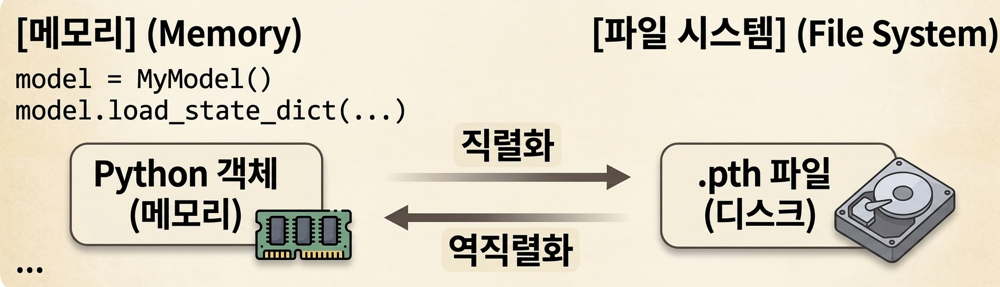

여러분은 이미 직렬화를 사용해 왔습니다.

```python
# 이것이 직렬화입니다
torch.save(model.state_dict(), "model.pth")

# 이것이 역직렬화입니다
model.load_state_dict(torch.load("model.pth"))
```

그런데 왜 이 주제를 별도 섹션으로 다루는 것일까요?

> **학습 단계에서의 직렬화**: 내가 나중에 다시 불러오면 됩니다.  
> **배포 단계에서의 직렬화**: 다른 환경, 다른 사람, 심지어 다른 언어에서도 불러와야 합니다.  

배포를 고려하면, 저장 방식의 선택지가 넓어지고, 각각의 트레이드오프를 이해해야 합니다.

### 4.2 실습 준비: 예제 모델 만들기


세 가지 직렬화 방식을 비교하기 위해, 간단한 이미지 분류 모델을 하나 정의하겠습니다.

> ⚠️ 이 모델은 직렬화 실습을 위한 예제입니다.
> 실제로 학습하지 않으며, 랜덤 가중치 상태로 저장/불러오기를 연습합니다

In [19]:
import torch
import torch.nn as nn


In [20]:
class SimpleClassifier(nn.Module):
    """
    간단한 이미지 분류 모델
    - 입력: 1x28x28 (MNIST와 동일한 크기)
    - 출력: 10개 클래스에 대한 확률
    """
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [21]:
# 모델 인스턴스 생성
model = SimpleClassifier(num_classes=10)

# 더미 입력으로 동작 확인
dummy_input = torch.randn(1, 1, 28, 28)  # (batch=1, channels=1, height=28, width=28)
output = model(dummy_input)

print(f"모델 구조:\n{model}\n")
print(f"입력 크기: {dummy_input.shape}")
print(f"출력 크기: {output.shape}")          # torch.Size([1, 10])
print(f"출력 값:   {output.detach()}")

모델 구조:
SimpleClassifier(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=3136, out_features=128, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=128, out_features=10, bias=True)
  )
)

입력 크기: torch.Size([1, 1, 28, 28])
출력 크기: torch.Size([1, 10])
출력 값:   tensor([[-0.0455, -0.0670, -0.0363, -0.1162,  0.0813, -0.0455,  0.3284,  0.1358,
         -0.1307,  0.0899]])


In [22]:
import os

# 모델 저장 폴더 확인
os.makedirs("models", exist_ok=True)

### 4.3 방법 1: state_dict 저장 (Pickle 기반)

가장 익숙한 방식입니다. PyTorch의 기본 저장 방식이며, 내부적으로 Python의 `pickle` 모듈을 사용합니다.

In [23]:
# state_dict: 모델의 가중치(파라미터)만 딕셔너리 형태로 저장합니다

# 1. 원본 모델을 평가 모드로 전환 (매우 중요!)
model.eval()

# 2. 원본 모델에서 출력값 생성
with torch.no_grad():
    output = model(dummy_input)

# 3. 모델 저장
torch.save(model.state_dict(), "models/model_state_dict.pth")

# 파일 크기 확인
file_size = os.path.getsize("models/model_state_dict.pth")
print(f"저장 완료: models/model_state_dict.pth")
print(f"파일 크기: {file_size / 1024:.1f} KB")

저장 완료: models/model_state_dict.pth
파일 크기: 1650.9 KB


In [24]:
# 저장된 내용 확인: 어떤 키들이 들어 있는지 살펴봅니다
state_dict = torch.load("models/model_state_dict.pth", weights_only=True)

print("저장된 키 목록:")
for key, tensor in state_dict.items():
    print(f"  {key:40s} → {tensor.shape}")


저장된 키 목록:
  features.0.weight                        → torch.Size([32, 1, 3, 3])
  features.0.bias                          → torch.Size([32])
  features.3.weight                        → torch.Size([64, 32, 3, 3])
  features.3.bias                          → torch.Size([64])
  classifier.1.weight                      → torch.Size([128, 3136])
  classifier.1.bias                        → torch.Size([128])
  classifier.4.weight                      → torch.Size([10, 128])
  classifier.4.bias                        → torch.Size([10])


> `.pth` 파일에는 **가중치(숫자 값)만** 저장됩니다.  
> 모델의 구조(어떤 레이어가 어떤 순서로 연결되는지)는 저장되지 않습니다.

#### 불러오기


In [25]:
# 불러올 때는 반드시 동일한 모델 클래스가 필요합니다
# 1. 원본 모델을 평가 모드로 전환 (매우 중요!)
model.eval()

# 2. 원본 모델에서 출력값 생성
with torch.no_grad():
    output = model(dummy_input)

# 3. 모델 저장
torch.save(model.state_dict(), "models/model_state_dict.pth")

# --- 여기서부터 불러오기 ---

# 4. 새 모델 선언 및 가중치 로드
loaded_model = SimpleClassifier(num_classes=10)
loaded_model.load_state_dict(torch.load("models/model_state_dict.pth", weights_only=True))

# 5. 불러온 모델도 평가 모드로 전환
loaded_model.eval()

# 6. 복원된 모델에서 출력값 생성
with torch.no_grad():
    loaded_output = loaded_model(dummy_input)

In [26]:

# 동일한 입력에 대해 동일한 출력이 나오는지 확인
with torch.no_grad():
    loaded_output = loaded_model(dummy_input)

print(f"원본 출력:  {output.detach()}")
print(f"복원 출력:  {loaded_output}")
print(f"동일 여부:  {torch.allclose(output.detach(), loaded_output)}")  # True

원본 출력:  tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
복원 출력:  tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
동일 여부:  True


#### 핵심 특징

```
장점:
  ✅ 가장 간단하고 직관적입니다.
  ✅ PyTorch 생태계에서 표준적인 방식입니다.
  ✅ 파일 크기가 작습니다 (가중치만 저장하므로).
  ✅ 학습 재개(resume)에 적합합니다.

단점:
  ❌ 모델 클래스 정의가 반드시 있어야 불러올 수 있습니다.
  ❌ Python + PyTorch 환경에서만 사용 가능합니다.
  ❌ pickle 기반이므로, 신뢰할 수 없는 파일은 보안 위험이 있습니다.
  ```


> ⚠️ **weights_only=True를 사용하는 이유**
>
> PyTorch 2.6부터 `torch.load()`의 기본 동작이 변경되었습니다.
> `pickle` 기반 로딩은 임의의 Python 코드를 실행할 수 있는 보안 위험이 있어,
> 가중치만 로드하는 `weights_only=True`가 권장됩니다.
> 이 옵션을 사용하면 state_dict에 포함된 텐서만 안전하게 불러옵니다.

### 4.4 방법 2: TorchScript


TorchScript는 PyTorch 모델을 **Python 없이도 실행할 수 있는 형태**로 변환하는 방법입니다.

```
state_dict 방식:
  .pth 파일 + 모델 클래스 정의 + Python + PyTorch  →  추론 가능

TorchScript 방식:
  .pt 파일만 있으면                  + PyTorch(또는 libtorch)  →  추론 가능
  (모델 구조가 파일 안에 포함됨)       (Python 없이도 가능)
```

#### 변환 방식: torch.jit.trace


In [27]:
# eval 모드로 전환 (Dropout, BatchNorm 등의 동작이 달라지므로 필수)
model.eval()

# trace: 더미 입력을 한 번 통과시켜서 모델의 연산 그래프를 기록합니다
traced_model = torch.jit.trace(model, dummy_input)

# 저장
traced_model.save("models/model_traced.pt")

file_size = os.path.getsize("models/model_traced.pt")
print(f"저장 완료: models/model_traced.pt")
print(f"파일 크기: {file_size / 1024:.1f} KB")


저장 완료: models/model_traced.pt
파일 크기: 1674.0 KB


#### 불러오기


In [28]:
# 핵심: 모델 클래스 정의가 필요 없습니다!
loaded_traced = torch.jit.load("models/model_traced.pt")

with torch.no_grad():
    traced_output = loaded_traced(dummy_input)

print(f"원본 출력:       {output.detach()}")
print(f"TorchScript 출력: {traced_output}")
print(f"동일 여부:        {torch.allclose(output.detach(), traced_output)}")  # True

원본 출력:       tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
TorchScript 출력: tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
동일 여부:        True


> `SimpleClassifier` 클래스를 `import`하지 않아도 모델이 동작합니다.  
> **모델 구조가 `.pt` 파일 안에 함께 저장**되어 있기 때문입니다.

#### trace vs script

TorchScript에는 두 가지 변환 방식이 있습니다.

In [29]:
# 방법 A: torch.jit.trace
# - 더미 입력을 실제로 통과시켜서 연산 경로를 기록합니다.
# - 장점: 대부분의 모델에서 잘 동작합니다.
# - 단점: 입력에 따라 분기(if/else)하는 로직은 기록되지 않습니다.
traced = torch.jit.trace(model, dummy_input)

# 방법 B: torch.jit.script
# - Python 코드를 직접 분석하여 TorchScript IR로 컴파일합니다.
# - 장점: if/else, for 루프 등 동적 로직도 변환됩니다.
# - 단점: Python 문법 중 지원되지 않는 것이 있어 에러가 발생할 수 있습니다.
scripted = torch.jit.script(model)

In [30]:
# 두 방식 모두 동일한 결과를 내는지 확인
with torch.no_grad():
    trace_out = traced(dummy_input)
    script_out = scripted(dummy_input)

print(f"trace 출력:  {trace_out}")
print(f"script 출력: {script_out}")
print(f"동일 여부:   {torch.allclose(trace_out, script_out)}")  # True

trace 출력:  tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
script 출력: tensor([[-0.0458,  0.1356, -0.0693, -0.0957,  0.0033,  0.0212,  0.1759, -0.0171,
         -0.0042, -0.1277]])
동일 여부:   True


> 💡 **실무 가이드**
>
> - 모델에 `if/else` 분기가 없다면 → `torch.jit.trace`를 사용합니다 (더 안정적).
> - 입력에 따라 다른 연산 경로를 타는 모델이라면 → `torch.jit.script`를 사용합니다.
> - 이 과정에서는 `torch.jit.trace`를 기본으로 사용합니다.

#### 핵심 특징

```
장점:
  ✅ 모델 클래스 정의 없이 불러올 수 있습니다.
  ✅ Python 없이 C++에서 실행 가능합니다 (libtorch).
  ✅ 일부 연산에서 최적화가 적용됩니다.

단점:
  ❌ 모든 Python 문법을 지원하지는 않습니다.
  ❌ 여전히 PyTorch(또는 libtorch) 런타임이 필요합니다.
  ❌ 동적 제어 흐름이 복잡한 모델은 변환이 어려울 수 있습니다.
```

### 4.5 방법 3: ONNX (Open Neural Network Exchange)

ONNX는 **프레임워크 간 호환성**을 목표로 하는 개방형 모델 포맷입니다.

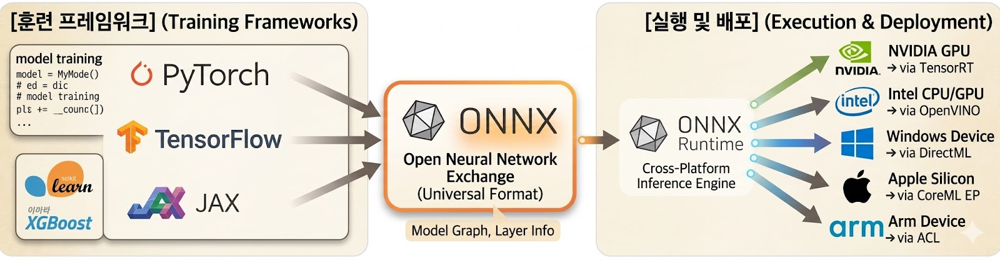

> PyTorch로 만든 모델을 TensorFlow 환경에서 실행해야 한다면?  
> 또는 NVIDIA TensorRT로 최적화된 추론을 하고 싶다면?  
> ONNX가 그 중간 다리 역할을 합니다.  

#### ONNX 변환 및 저장


In [31]:
# Mac / 로컬: 현재 커널에 ONNX 설치 (!pip 대신 sys.executable)
import sys
import subprocess

subprocess.check_call(
    [sys.executable, "-m", "pip", "install", "-q", "onnx", "onnxscript", "onnxruntime"]
)
print("installed →", sys.executable)

import onnx
print("onnx", onnx.__version__)


installed → /Library/Developer/CommandLineTools/usr/bin/python3
onnx 1.19.1


In [32]:
import torch, onnx

model.eval()

torch.onnx.export(
    model,                                    # 변환할 모델
    dummy_input,                              # 더미 입력 (모델 트레이싱에 사용)
    "models/model.onnx",                      # 저장 경로
    export_params=True,                       # 가중치를 파일에 포함
    opset_version=17,                         # ONNX 연산자 버전
    input_names=["image"],                    # 입력 텐서 이름
    output_names=["prediction"],              # 출력 텐서 이름
    dynamic_axes={                            # 가변 크기 축 지정
        "image": {0: "batch_size"},           # batch 크기를 동적으로
        "prediction": {0: "batch_size"},
    }
)

/var/folders/pz/kxyvptf55r59t4ktwsn_rhfc0000gn/T/ipykernel_74403/414124384.py:5: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encourage you to try it and share feedback to help improve the experience. Learn more about the new export logic: https://pytorch.org/docs/stable/onnx_dynamo.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html.
  torch.onnx.export(


In [33]:
file_size = os.path.getsize("models/model.onnx")
print(f"저장 완료: models/model.onnx")
print(f"파일 크기: {file_size / 1024:.1f} KB")

저장 완료: models/model.onnx
파일 크기: 1649.1 KB



> 💡 **dynamic_axes가 중요한 이유**
>
> 이 설정이 없으면 모델이 `batch_size=1`로 고정됩니다.
> 배포 시에는 요청에 따라 배치 크기가 달라질 수 있으므로,
> `dynamic_axes`로 가변 축을 지정하는 것이 좋습니다.

#### ONNX 모델 검증


In [34]:
import onnx

# 모델 구조 검증
onnx_model = onnx.load("models/model.onnx")
onnx.checker.check_model(onnx_model)
print("✅ ONNX 모델 검증 통과")

# 모델 정보 확인
print(f"\n입력:")
for inp in onnx_model.graph.input:
    print(f"  이름: {inp.name}")
    shape = [d.dim_param or d.dim_value for d in inp.type.tensor_type.shape.dim]
    print(f"  크기: {shape}")

print(f"\n출력:")
for out in onnx_model.graph.output:
    print(f"  이름: {out.name}")
    shape = [d.dim_param or d.dim_value for d in out.type.tensor_type.shape.dim]
    print(f"  크기: {shape}")

✅ ONNX 모델 검증 통과

입력:
  이름: image
  크기: ['batch_size', 1, 28, 28]

출력:
  이름: prediction
  크기: ['batch_size', 10]


#### ONNX Runtime으로 추론


In [35]:
import onnxruntime as ort
import numpy as np

# ONNX Runtime 세션 생성
session = ort.InferenceSession("models/model.onnx")

# 입력 데이터 준비 (NumPy 배열로 변환)
input_data = dummy_input.numpy()

# 추론 실행
onnx_output = session.run(
    output_names=["prediction"],
    input_feed={"image": input_data}
)

In [36]:
print(f"PyTorch 출력:       {output.detach().numpy()}")
print(f"ONNX Runtime 출력:  {onnx_output[0]}")
print(f"동일 여부 (오차 허용): {np.allclose(output.detach().numpy(), onnx_output[0], atol=1e-5)}")

PyTorch 출력:       [[-0.0458221   0.13558471 -0.06933513 -0.0956936   0.00326818  0.0212366
   0.17589971 -0.0170908  -0.00419325 -0.1276926 ]]
ONNX Runtime 출력:  [[-0.04582207  0.13558474 -0.06933517 -0.09569376  0.00326817  0.02123658
   0.1758998  -0.01709076 -0.00419329 -0.12769262]]
동일 여부 (오차 허용): True


> ⚠️ **소수점 미세 차이**
>
> ONNX Runtime과 PyTorch의 결과가 완벽히 동일하지 않을 수 있습니다.  
> 부동소수점 연산 순서 차이로 인한 것이며, `atol=1e-5` 수준의 오차는 정상입니다.  

#### 핵심 특징

```
장점:
  ✅ 프레임워크에 독립적입니다 (PyTorch, TensorFlow, JAX 등 어디서든 변환 가능).
  ✅ ONNX Runtime은 매우 빠른 추론 속도를 제공합니다.
  ✅ TensorRT, OpenVINO 등 하드웨어 최적화 엔진과 호환됩니다.
  ✅ Python 없이도 C++, C#, Java 등에서 실행 가능합니다.

단점:
  ❌ 변환 과정에서 지원되지 않는 연산이 있을 수 있습니다.
  ❌ 모델 구조가 복잡할수록 변환 에러 가능성이 높아집니다.
  ❌ 디버깅이 어렵습니다 (ONNX 그래프는 사람이 읽기 어려움).
```

### 4.6 세 가지 방법 비교 정리

In [37]:
# 저장된 파일 크기 비교
files = {
    "state_dict (.pth)": "models/model_state_dict.pth",
    "TorchScript (.pt)":  "models/model_traced.pt",
    "ONNX (.onnx)":       "models/model.onnx",
}

print(f"{'방식':<25} {'파일 크기':>10}")
print("-" * 37)
for name, path in files.items():
    if os.path.exists(path):
        size_kb = os.path.getsize(path) / 1024
        print(f"{name:<25} {size_kb:>8.1f} KB")

방식                             파일 크기
-------------------------------------
state_dict (.pth)           1650.9 KB
TorchScript (.pt)           1674.0 KB
ONNX (.onnx)                1649.1 KB


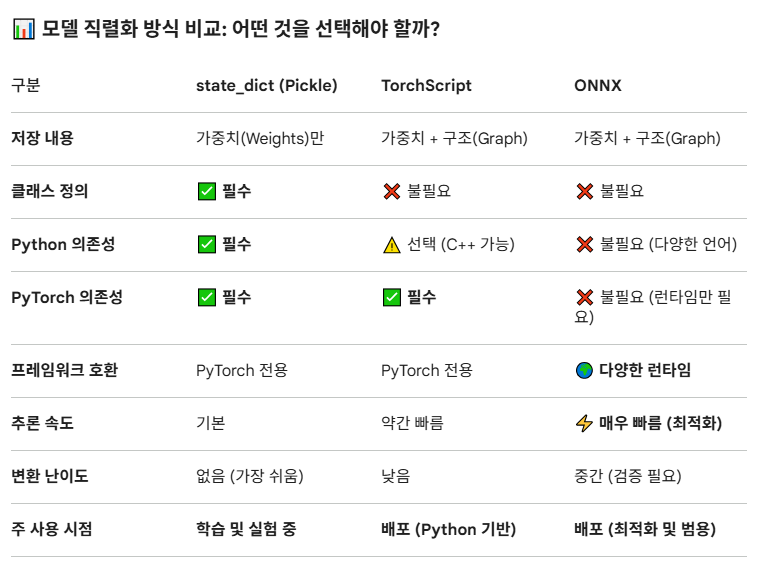


> 💡 **그래서 어떤 것을 써야 합니까?**
>
> 이 과정에서의 권장 기준은 다음과 같습니다:
>
> - **학습 중, 실험 중**: `state_dict` — 가장 간단하고, 학습 재개에 적합합니다.
> - **FastAPI로 서빙 (이 과정의 프로젝트)**: `state_dict` 또는 `TorchScript` — Python 환경이므로 어느 것이든 무방합니다.
> - **성능 최적화가 필요할 때**: `ONNX` + ONNX Runtime — 추론 속도가 중요한 프로덕션 환경에 적합합니다.
>
> 이 과정의 프로젝트에서는 **state_dict 방식**을 기본으로 사용합니다.
> 가장 직관적이고, 디버깅이 쉽기 때문입니다.


### ✅ 체크포인트

다음 질문에 답할 수 있다면, 이 섹션의 학습 목표를 달성한 것입니다:

1. `state_dict`로 저장한 `.pth` 파일을 불러올 때, 모델 클래스 정의가 필요한 이유는 무엇입니까?
2. `torch.jit.trace`와 `torch.jit.script`는 각각 어떤 상황에서 사용합니까?
3. ONNX의 가장 큰 장점은 무엇이며, 어떤 상황에서 선택해야 합니까?
4. `torch.onnx.export()`에서 `dynamic_axes`를 지정하지 않으면 어떤 문제가 생길 수 있습니까?

## 5. 실습: 학습된 모델을 저장하고 다시 불러오기



> **실습 목표**
> - MNIST 데이터셋으로 모델을 실제로 학습합니다.
> - 학습된 모델을 세 가지 방식(state_dict, TorchScript, ONNX)으로 저장합니다.
> - 저장된 모델을 불러와 추론하고, 결과가 동일한지 검증합니다.
> - Day 1 전체 내용을 하나의 워크플로우로 체험합니다.


### 5.1 전체 워크플로우 미리보기

오늘 배운 모든 내용을 하나로 엮으면 다음과 같습니다.

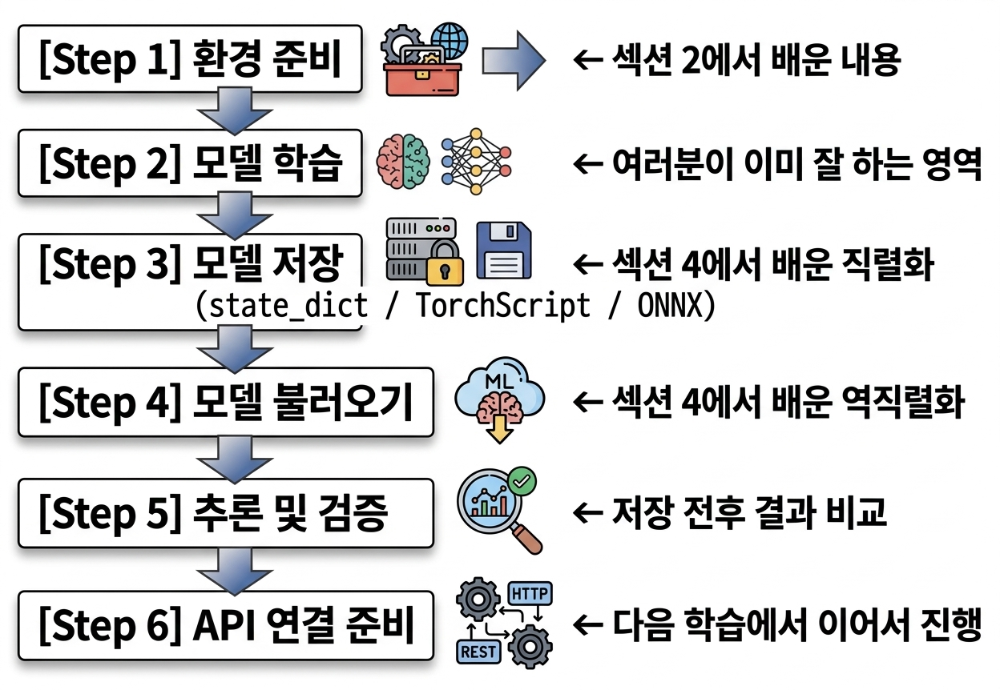

첫 단계는 앞서 완료하였으니, Step2부터 이어 진행하겠습니다.


### 5.2 Step 2 — 모델 학습

MNIST 데이터셋으로 섹션 4에서 정의한 `SimpleClassifier`를 학습합니다.

> 이미 모델 학습에 익숙하시므로, 코드에 대한 상세 설명은 최소화합니다.
> 핵심은 학습이 아니라 **학습 이후의 과정**입니다.

In [38]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

In [39]:
# ===== 모델 정의 (섹션 4와 동일) =====
class SimpleClassifier(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [40]:
# ===== 하이퍼파라미터 =====
BATCH_SIZE = 64
LEARNING_RATE = 1e-3
EPOCHS = 3            # 실습용이므로 3 에포크만 학습합니다

# ===== 디바이스 설정 =====
# Mac: MPS → CUDA → CPU 순으로 선택
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"사용 디바이스: {device}")


사용 디바이스: mps


In [41]:
# ===== 데이터 준비 =====
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))   # MNIST 평균/표준편차
])

train_dataset = datasets.MNIST(
    root="data", train=True, download=True, transform=transform
)
test_dataset = datasets.MNIST(
    root="data", train=False, download=True, transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

print(f"학습 데이터: {len(train_dataset):,}장")
print(f"테스트 데이터: {len(test_dataset):,}장")

100%|██████████| 9.91M/9.91M [00:16<00:00, 596kB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 140kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.42MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.17MB/s]

학습 데이터: 60,000장
테스트 데이터: 10,000장


In [42]:
model = SimpleClassifier(num_classes=10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [43]:
for epoch in range(1, EPOCHS + 1):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for batch_idx, (images, labels) in enumerate(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        # 200 배치마다 진행 상황 출력
        if (batch_idx + 1) % 200 == 0:
            print(f"  Epoch {epoch} [{batch_idx+1}/{len(train_loader)}] "
                  f"Loss: {running_loss/(batch_idx+1):.4f} "
                  f"Acc: {100.*correct/total:.1f}%")

    # 에포크 종료 시 요약
    train_acc = 100. * correct / total
    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch}/{EPOCHS} 완료 — Loss: {avg_loss:.4f}, Acc: {train_acc:.1f}%\n")

  Epoch 1 [200/938] Loss: 0.4835 Acc: 84.5%
  Epoch 1 [400/938] Loss: 0.3271 Acc: 89.7%
  Epoch 1 [600/938] Loss: 0.2654 Acc: 91.8%
  Epoch 1 [800/938] Loss: 0.2289 Acc: 93.0%
Epoch 1/3 완료 — Loss: 0.2103, Acc: 93.6%

  Epoch 2 [200/938] Loss: 0.0893 Acc: 97.3%
  Epoch 2 [400/938] Loss: 0.0836 Acc: 97.4%
  Epoch 2 [600/938] Loss: 0.0830 Acc: 97.6%
  Epoch 2 [800/938] Loss: 0.0839 Acc: 97.5%
Epoch 2/3 완료 — Loss: 0.0825, Acc: 97.6%

  Epoch 3 [200/938] Loss: 0.0565 Acc: 98.4%
  Epoch 3 [400/938] Loss: 0.0568 Acc: 98.3%
  Epoch 3 [600/938] Loss: 0.0603 Acc: 98.2%
  Epoch 3 [800/938] Loss: 0.0612 Acc: 98.1%
Epoch 3/3 완료 — Loss: 0.0605, Acc: 98.1%



### 5.3 Step 3 — 세 가지 방식으로 모델 저장

학습이 완료된 모델을 세 가지 방식으로 저장합니다.

> ⚠️ **중요**: 저장 전에 반드시 `model.eval()`을 호출해야 합니다.  
> Dropout, BatchNorm 등은 학습 모드와 추론 모드에서 동작이 다릅니다.
> 추론용으로 저장할 때는 항상 eval 모드에서 진행합니다.

In [44]:
import os
os.makedirs("models", exist_ok=True)

# 모델을 CPU로 이동 (배포 환경에서는 GPU가 없을 수 있으므로)
model_cpu = model.cpu()
model_cpu.eval()

# 추론 비교용 테스트 입력
test_input = test_dataset[0][0].unsqueeze(0)   # 첫 번째 테스트 이미지
test_label = test_dataset[0][1]                 # 정답 레이블

print(f"테스트 입력 크기: {test_input.shape}")
print(f"정답 레이블: {test_label}")

테스트 입력 크기: torch.Size([1, 1, 28, 28])
정답 레이블: 7


In [45]:
# 저장 전 원본 모델의 추론 결과를 기록해 둡니다
with torch.no_grad():
    original_output = model_cpu(test_input)
    original_pred = original_output.argmax(dim=1).item()
    original_conf = torch.softmax(original_output, dim=1).max().item()

print(f"원본 모델 예측: {original_pred} (확신도: {original_conf:.4f})")
print(f"정답:          {test_label}")
print(f"정답 여부:      {'✅ 맞음' if original_pred == test_label else '❌ 틀림'}")


원본 모델 예측: 7 (확신도: 1.0000)
정답:          7
정답 여부:      ✅ 맞음


#### 방법 1: state_dict


In [46]:
# state_dict 저장
torch.save(model_cpu.state_dict(), "models/mnist_state_dict.pth")
print(f"✅ state_dict 저장 완료: {os.path.getsize('models/mnist_state_dict.pth') / 1024:.1f} KB")

✅ state_dict 저장 완료: 1650.9 KB


#### 방법 2: TorchScript


In [47]:
# TorchScript 변환 및 저장
traced_model = torch.jit.trace(model_cpu, test_input)
traced_model.save("models/mnist_traced.pt")
print(f"✅ TorchScript 저장 완료: {os.path.getsize('models/mnist_traced.pt') / 1024:.1f} KB")

✅ TorchScript 저장 완료: 1674.8 KB


#### 방법 3: ONNX

In [48]:
import onnxscript

In [49]:
# ONNX 변환 및 저장
torch.onnx.export(
    model_cpu,
    test_input,
    "models/mnist_model.onnx",
    export_params=True,
    opset_version=17,
    input_names=["image"],
    output_names=["prediction"],
    dynamic_axes={
        "image": {0: "batch_size"},
        "prediction": {0: "batch_size"},
    }
)
print(f"✅ ONNX 저장 완료: {os.path.getsize('models/mnist_model.onnx') / 1024:.1f} KB")

✅ ONNX 저장 완료: 1649.1 KB


/var/folders/pz/kxyvptf55r59t4ktwsn_rhfc0000gn/T/ipykernel_74403/3579515550.py:2: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encourage you to try it and share feedback to help improve the experience. Learn more about the new export logic: https://pytorch.org/docs/stable/onnx_dynamo.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html.
  torch.onnx.export(


In [50]:
# 저장 결과 요약
print("\n" + "=" * 50)
print("📁 models/ 폴더 내용")
print("=" * 50)
for fname in sorted(os.listdir("models")):
    fpath = os.path.join("models", fname)
    size_kb = os.path.getsize(fpath) / 1024
    print(f"  {fname:<30} {size_kb:>8.1f} KB")


📁 models/ 폴더 내용
  mnist_model.onnx                 1649.1 KB
  mnist_state_dict.pth             1650.9 KB
  mnist_traced.pt                  1674.8 KB
  model.onnx                       1649.1 KB
  model_state_dict.pth             1650.9 KB
  model_traced.pt                  1674.0 KB



### 5.4 Step 4 — 불러오기 및 추론 검증

이제 핵심입니다. 저장된 모델을 **각각 독립적으로** 불러와서 추론하고,
원본 결과와 동일한지 검증합니다.

> 이 단계가 중요한 이유:  
> 저장은 성공했는데 불러왔을 때 결과가 다르다면, 배포 후 잘못된 예측을 하게 됩니다.  
> **저장-불러오기-추론 결과의 일관성 검증은 배포 전 필수 절차입니다.**

### 검증 1: state_dict

In [51]:
# 클래스 정의가 반드시 있어야 합니다
loaded_sd = SimpleClassifier(num_classes=10)
loaded_sd.load_state_dict(
    torch.load("models/mnist_state_dict.pth", weights_only=True)
)
loaded_sd.eval()

with torch.no_grad():
    sd_output = loaded_sd(test_input)
    sd_pred = sd_output.argmax(dim=1).item()

print(f"[state_dict] 예측: {sd_pred}, 원본과 일치: {torch.allclose(original_output, sd_output)}")

[state_dict] 예측: 7, 원본과 일치: True



#### 검증 2: TorchScript

In [52]:
# 클래스 정의가 필요 없습니다
loaded_ts = torch.jit.load("models/mnist_traced.pt")

with torch.no_grad():
    ts_output = loaded_ts(test_input)
    ts_pred = ts_output.argmax(dim=1).item()

print(f"[TorchScript] 예측: {ts_pred}, 원본과 일치: {torch.allclose(original_output, ts_output)}")

[TorchScript] 예측: 7, 원본과 일치: True



#### 검증 3: ONNX

In [53]:
import onnxruntime as ort
import numpy as np

session = ort.InferenceSession("models/mnist_model.onnx")
onnx_output = session.run(
    ["prediction"],
    {"image": test_input.numpy()}
)

onnx_pred = np.argmax(onnx_output[0], axis=1)[0]
match = np.allclose(original_output.numpy(), onnx_output[0], atol=1e-5)

print(f"[ONNX]        예측: {onnx_pred}, 원본과 일치 (오차 허용): {match}")

[ONNX]        예측: 7, 원본과 일치 (오차 허용): True


#### 종합 검증 결과

In [54]:
print("\n" + "=" * 60)
print("📊 직렬화 검증 결과 요약")
print("=" * 60)
print(f"  정답 레이블:        {test_label}")
print(f"  원본 모델 예측:     {original_pred}")
print(f"  state_dict 예측:   {sd_pred}  {'✅' if sd_pred == original_pred else '❌'}")
print(f"  TorchScript 예측:  {ts_pred}  {'✅' if ts_pred == original_pred else '❌'}")
print(f"  ONNX 예측:         {onnx_pred}  {'✅' if onnx_pred == original_pred else '❌'}")
print("=" * 60)

if all(p == original_pred for p in [sd_pred, ts_pred, onnx_pred]):
    print("\n🎉 세 가지 방식 모두 원본과 동일한 결과를 반환합니다.")
    print("   모델을 안전하게 직렬화하고 복원할 수 있다는 것이 검증되었습니다.")


📊 직렬화 검증 결과 요약
  정답 레이블:        7
  원본 모델 예측:     7
  state_dict 예측:   7  ✅
  TorchScript 예측:  7  ✅
  ONNX 예측:         7  ✅

🎉 세 가지 방식 모두 원본과 동일한 결과를 반환합니다.
   모델을 안전하게 직렬화하고 복원할 수 있다는 것이 검증되었습니다.


### 5.5 Step 5 — 배치 추론 테스트


실제 배포 환경에서는 한 번에 여러 개의 입력이 들어올 수 있습니다.
배치 추론도 정상적으로 동작하는지 확인합니다.



In [55]:
# 테스트 데이터에서 8장을 배치로 묶습니다
batch_images = torch.stack([test_dataset[i][0] for i in range(8)])
batch_labels = [test_dataset[i][1] for i in range(8)]

print(f"배치 입력 크기: {batch_images.shape}")  # torch.Size([8, 1, 28, 28])

배치 입력 크기: torch.Size([8, 1, 28, 28])


In [56]:
# 세 가지 방식으로 배치 추론
with torch.no_grad():
    sd_batch = loaded_sd(batch_images).argmax(dim=1).tolist()
    ts_batch = loaded_ts(batch_images).argmax(dim=1).tolist()

onnx_batch_out = session.run(["prediction"], {"image": batch_images.numpy()})
onnx_batch = np.argmax(onnx_batch_out[0], axis=1).tolist()

# 결과 비교
print(f"\n{'이미지':<8} {'정답':<6} {'state_dict':<12} {'TorchScript':<13} {'ONNX':<8}")
print("-" * 50)
for i in range(8):
    match = "✅" if sd_batch[i] == ts_batch[i] == onnx_batch[i] == batch_labels[i] else "❌"
    print(f"  #{i:<5} {batch_labels[i]:<6} {sd_batch[i]:<12} {ts_batch[i]:<13} {onnx_batch[i]:<8} {match}")


이미지      정답     state_dict   TorchScript   ONNX    
--------------------------------------------------
  #0     7      7            7             7        ✅
  #1     2      2            2             2        ✅
  #2     1      1            1             1        ✅
  #3     0      0            0             0        ✅
  #4     4      4            4             4        ✅
  #5     1      1            1             1        ✅
  #6     4      4            4             4        ✅
  #7     9      9            9             9        ✅


### 5.6 Step 6 — API 연결 준비: 추론 함수 분리



마지막으로, 이후 FastAPI에 연결하기 쉽도록
**추론 로직을 함수로 분리**해 두겠습니다.

In [57]:
# app/model_utils.py 생성 (%%writefile 대신 Path.write_text — Run All 호환)
from pathlib import Path

Path("app").mkdir(parents=True, exist_ok=True)
Path("app/__init__.py").write_text("", encoding="utf-8")
Path("app/model_utils.py").write_text(
    "\"\"\"\n모델 로드 및 추론 유틸리티\nFastAPI 엔드포인트가 이 모듈을 import하여 사용합니다.\n\"\"\"\n\n\nimport torch\nimport torch.nn as nn\nfrom torchvision import transforms\n\n\n# ===== 모델 정의 =====\nclass SimpleClassifier(nn.Module):\n    def __init__(self, num_classes=10):\n        super().__init__()\n        self.features = nn.Sequential(\n            nn.Conv2d(1, 32, kernel_size=3, padding=1),\n            nn.ReLU(),\n            nn.MaxPool2d(2),\n            nn.Conv2d(32, 64, kernel_size=3, padding=1),\n            nn.ReLU(),\n            nn.MaxPool2d(2),\n        )\n        self.classifier = nn.Sequential(\n            nn.Flatten(),\n            nn.Linear(64 * 7 * 7, 128),\n            nn.ReLU(),\n            nn.Dropout(0.5),\n            nn.Linear(128, num_classes),\n        )\n\n    def forward(self, x):\n        x = self.features(x)\n        x = self.classifier(x)\n        return x\n\n\n# ===== 전처리 파이프라인 =====\npreprocess = transforms.Compose([\n    transforms.Grayscale(num_output_channels=1),\n    transforms.Resize((28, 28)),\n    transforms.ToTensor(),\n    transforms.Normalize((0.1307,), (0.3081,)),\n])\n\n\n# ===== 모델 로드 =====\ndef load_model(model_path: str, num_classes: int = 10) -> nn.Module:\n    \"\"\"저장된 state_dict를 불러와서 추론 가능한 모델을 반환합니다.\"\"\"\n    model = SimpleClassifier(num_classes=num_classes)\n    model.load_state_dict(\n        torch.load(model_path, map_location=\"cpu\", weights_only=True)\n    )\n    model.eval()\n    return model\n\n\n# ===== 추론 =====\n# 클래스 이름 매핑\nCLASS_NAMES = [str(i) for i in range(10)]   # MNIST: \"0\" ~ \"9\"\n\n\ndef predict(model: nn.Module, image_tensor: torch.Tensor) -> dict:\n    \"\"\"\n    전처리된 이미지 텐서를 받아 추론 결과를 반환합니다.\n\n    Args:\n        model: 로드된 PyTorch 모델\n        image_tensor: (1, 1, 28, 28) 형태의 텐서\n\n    Returns:\n        {\n            \"predicted_class\": \"7\",\n            \"confidence\": 0.98,\n            \"probabilities\": {\"0\": 0.001, \"1\": 0.002, ...}\n        }\n    \"\"\"\n    with torch.no_grad():\n        output = model(image_tensor)\n        probabilities = torch.softmax(output, dim=1)[0]\n\n        predicted_idx = probabilities.argmax().item()\n        confidence = probabilities[predicted_idx].item()\n\n        prob_dict = {\n            CLASS_NAMES[i]: round(probabilities[i].item(), 4)\n            for i in range(len(CLASS_NAMES))\n        }\n\n    return {\n        \"predicted_class\": CLASS_NAMES[predicted_idx],\n        \"confidence\": round(confidence, 4),\n        \"probabilities\": prob_dict,\n    }\n",
    encoding="utf-8",
)
print("wrote", Path("app/model_utils.py").resolve())


wrote /Users/choiseunghyeon/AIFFEL_Quest_ENG/06_Deployment/DP01/app/model_utils.py


In [58]:
# 작성한 모듈이 정상 동작하는지 테스트합니다
import sys
sys.path.insert(0, ".")

from app.model_utils import load_model, predict, preprocess

# 모델 로드
model_for_api = load_model("models/mnist_state_dict.pth")

# 추론 테스트
result = predict(model_for_api, test_input)

print("추론 결과:")
print(f"  예측 클래스: {result['predicted_class']}")
print(f"  확신도:     {result['confidence']}")
print(f"  전체 확률:")
for cls, prob in result['probabilities'].items():
    bar = "█" * int(prob * 50)
    print(f"    {cls}: {prob:.4f} {bar}")

추론 결과:
  예측 클래스: 7
  확신도:     1.0
  전체 확률:
    0: 0.0000 
    1: 0.0000 
    2: 0.0000 
    3: 0.0000 
    4: 0.0000 
    5: 0.0000 
    6: 0.0000 
    7: 1.0000 ██████████████████████████████████████████████████
    8: 0.0000 
    9: 0.0000 


### 5.7 프로젝트 최종 구조 확인


모든 실습이 끝났습니다. 현재 프로젝트 구조를 확인합니다.


In [59]:

import os

def show_tree(path, prefix="", max_depth=2, current_depth=0):
    """프로젝트 폴더 구조를 트리 형태로 출력합니다."""
    if current_depth >= max_depth:
        return

    entries = sorted(os.listdir(path))
    # .venv 등 무거운 폴더는 제외
    entries = [e for e in entries if e not in {".venv", ".venv_test", "__pycache__", ".ipynb_checkpoints"}]

    for i, entry in enumerate(entries):
        full_path = os.path.join(path, entry)
        connector = "└── " if i == len(entries) - 1 else "├── "

        if os.path.isdir(full_path):
            print(f"{prefix}{connector}📁 {entry}/")
            extension = "    " if i == len(entries) - 1 else "│   "
            show_tree(full_path, prefix + extension, max_depth, current_depth + 1)
        else:
            size = os.path.getsize(full_path)
            if size > 1024:
                size_str = f"({size/1024:.1f} KB)"
            else:
                size_str = f"({size} B)"
            print(f"{prefix}{connector}{entry} {size_str}")

print("model-serving-course/")
show_tree(".")

model-serving-course/
├── .gitignore (108 B)
├── DP01.ipynb (8201.1 KB)
├── README.md (2.5 KB)
├── 📁 app/
│   ├── __init__.py (0 B)
│   └── model_utils.py (2.5 KB)
├── 📁 data/
│   └── 📁 MNIST/
├── 📁 frontend/
├── 📁 models/
│   ├── mnist_model.onnx (1649.1 KB)
│   ├── mnist_state_dict.pth (1650.9 KB)
│   ├── mnist_traced.pt (1674.8 KB)
│   ├── model.onnx (1649.1 KB)
│   ├── model_state_dict.pth (1650.9 KB)
│   └── model_traced.pt (1674.0 KB)
├── 📁 notebooks/
├── requirements.txt (282 B)
└── 📁 tests/



### ✅ 마치며

오늘 학습한 전체 내용을 점검합니다.  
아래 질문에 모두 답할 수 있다면, Day 1의 학습 목표를 달성한 것입니다.

```
[섹션 1: 들어가며]
Q1. 모델 학습과 모델 배포의 핵심 차이를 한 문장으로 설명하세요.
Q2. "내 컴퓨터에서는 되는데" 문제의 근본 원인은 무엇입니까?

[섹션 2: 환경 세팅]
Q3. 가상환경을 사용하지 않으면 어떤 문제가 발생할 수 있습니까?
Q4. pip freeze와 직접 작성한 requirements.txt의 용도 차이는?

[섹션 3: RESTful API]
Q5. 모델 추론 요청에 POST를 사용하는 이유는?
Q6. 상태 코드 200, 400, 500은 각각 어떤 상황을 의미합니까?

[섹션 4: 모델 직렬화]
Q7. state_dict 방식은 왜 모델 클래스 정의가 필요합니까?
Q8. ONNX의 가장 큰 장점과, 사용해야 할 시점은?

[섹션 5: 실습]
Q9. 모델 저장 전에 model.eval()을 호출해야 하는 이유는?
Q10. predict() 함수를 별도 모듈로 분리한 이유는 무엇입니까?

### 제출  

다음 내역을 MD 파일로 기록, 깃헙에 업로드하여 링크로 제출하시기 바랍니다  

1.  5-7 수행 내역 캡쳐

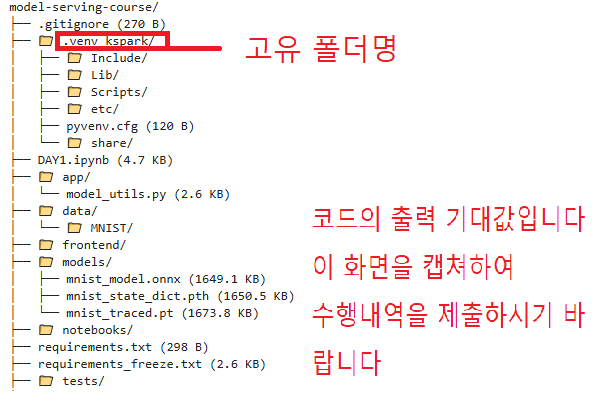

2. 각 섹션의 체크포인트의 답변

수고하셨습니다!